### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> Import Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns

from   scipy.stats               import ttest_1samp, ttest_ind

from statsmodels.formula.api import ols      # For n-way ANOVA
from statsmodels.stats.anova import _get_covariance,anova_lm # For n-way ANOVA
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
sns.set(color_codes=True)
sns.set_palette('deep')

%config InlineBackend.figure_format ='retina'

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## <span style="font-family: Arial; font-weight:bold;font-size:1.4em;color:#0320fc"> Problem 1 - FEVER

<font size=4; color=darkblue>

A research laboratory was developing a new compound for the relief of severe cases of hay fever. In an experiment with 36 volunteers, the amounts of the two active ingredients (A & B) in the compound were varied at three levels each. Randomization was used in assigning four volunteers to each of the nine treatments. The data on hours of relief can be found in the following .csv file: Fever.csv

In [2]:
fev = pd.read_csv('Fever-1.csv')
fev.head(10).to_csv('fever_head.csv')

In [3]:
fev.tail()

,A,B,Volunteer,Relief
31,3,2,4,10.1
32,3,3,1,13.5
33,3,3,2,13.0
34,3,3,3,13.3
35,3,3,4,13.2


In [4]:
fev.shape

(36, 4)

In [5]:
fev.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36 entries, 0 to 35
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   A          36 non-null     int64  
 1   B          36 non-null     int64  
 2   Volunteer  36 non-null     int64  
 3   Relief     36 non-null     float64
dtypes: float64(1), int64(3)
memory usage: 1.2 KB


In [6]:
fev.describe().to_csv('fever_describe.csv')
fev.describe()

,A,B,Volunteer,Relief
count,36.000000,36.000000,36.000000,36.000000
mean,2.000000,2.000000,2.500000,7.183333
std,0.828079,0.828079,1.133893,3.272090
min,1.000000,1.000000,1.000000,2.300000
25%,1.000000,1.000000,1.750000,4.675000
50%,2.000000,2.000000,2.500000,6.000000
75%,3.000000,3.000000,3.250000,9.325000
max,3.000000,3.000000,4.000000,13.500000


<font color=darkblue>
    
* 4 Variables
* Variables - 'A, B and Volunteer' - int dtype (CONVERTING TO CATEGORICAL)
* Variable - 'Relief' - float dtype

In [7]:
fev['A'] = pd.Categorical(fev['A'])
fev['B'] = pd.Categorical(fev['B'])
fev['Volunteer'] = pd.Categorical(fev['Volunteer'])

In [8]:
fev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36 entries, 0 to 35
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   A          36 non-null     category
 1   B          36 non-null     category
 2   Volunteer  36 non-null     category
 3   Relief     36 non-null     float64 
dtypes: category(3), float64(1)
memory usage: 924.0 bytes


In [9]:
fev.describe(include='all').to_csv('fever_describe.csv')
fev.describe(include='all')

,A,B,Volunteer,Relief
count,36.0,36.0,36.0,36.000000
unique,3.0,3.0,4.0,NaN
top,3.0,3.0,4.0,NaN
freq,12.0,12.0,9.0,NaN
mean,NaN,NaN,NaN,7.183333
std,NaN,NaN,NaN,3.272090
min,NaN,NaN,NaN,2.300000
25%,NaN,NaN,NaN,4.675000
50%,NaN,NaN,NaN,6.000000
75%,NaN,NaN,NaN,9.325000


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> Check for Null Values

In [10]:
fev.isnull().sum()

A            0
B            0
Volunteer    0
Relief       0
dtype: int64

In [11]:
fev.isnull().sum().sum()

0

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> Check for Duplicates

In [12]:
fev.duplicated().sum()

0

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> Check for Unique Content in Each Variable

In [13]:
fev['A'].unique()

[1, 2, 3]
Categories (3, int64): [1, 2, 3]

In [14]:
fev['A'].value_counts()

3    12
2    12
1    12
Name: A, dtype: int64

In [15]:
fev['B'].unique()

[1, 2, 3]
Categories (3, int64): [1, 2, 3]

In [16]:
fev['B'].value_counts()

3    12
2    12
1    12
Name: B, dtype: int64

In [17]:
fev['Volunteer'].unique()

[1, 2, 3, 4]
Categories (4, int64): [1, 2, 3, 4]

In [18]:
fev['Volunteer'].value_counts()

4    9
3    9
2    9
1    9
Name: Volunteer, dtype: int64

In [19]:
fev.nunique()

A             3
B             3
Volunteer     4
Relief       33
dtype: int64

<AxesSubplot:xlabel='Relief'>

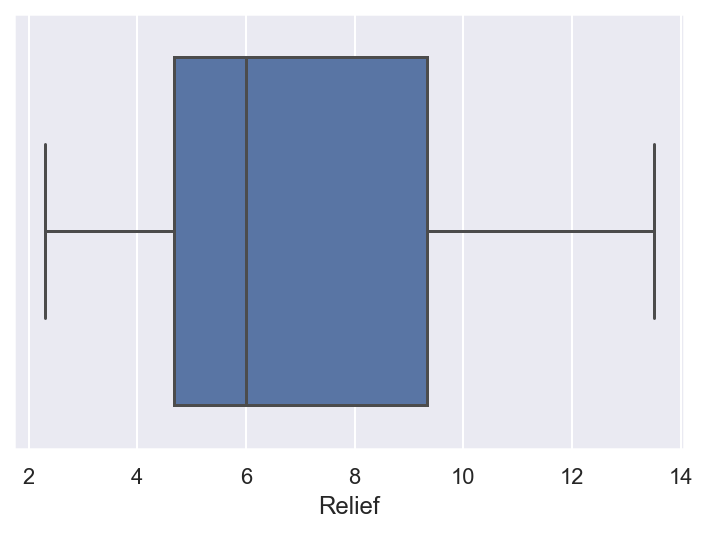

In [20]:
sns.boxplot(x='Relief', data=fev)

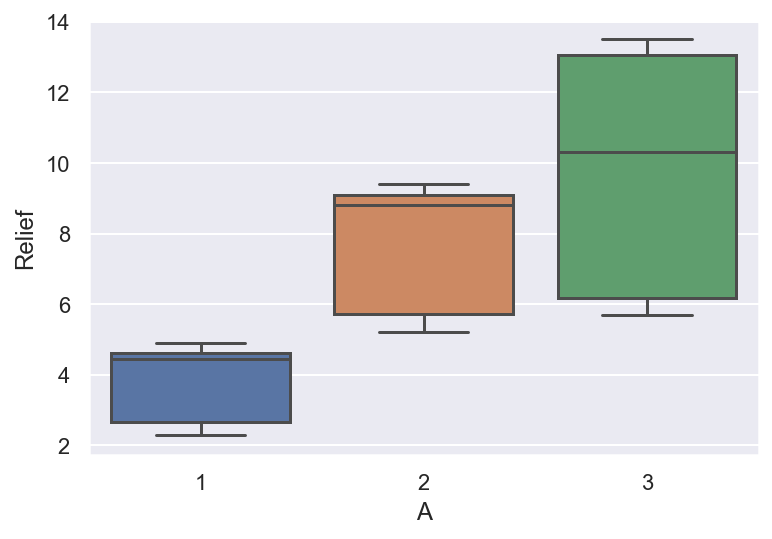

In [21]:
sns.boxplot(x='A', y='Relief', data=fev);

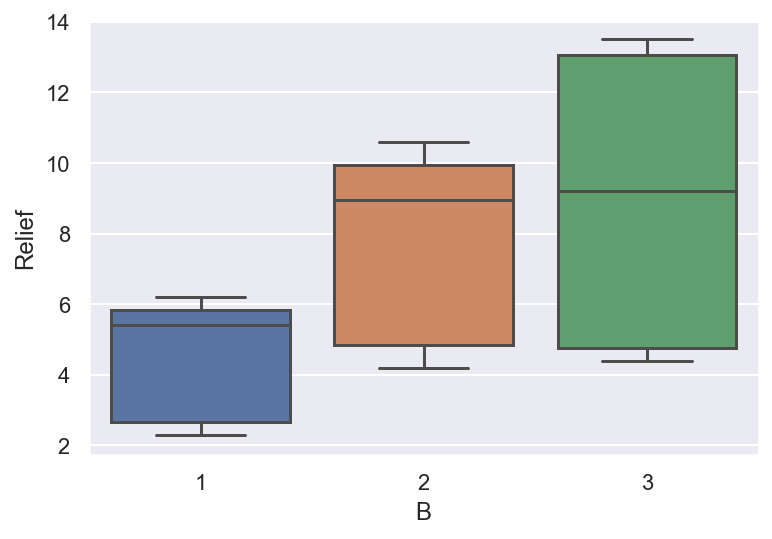

In [22]:
sns.boxplot(x='B', y='Relief', data=fev);

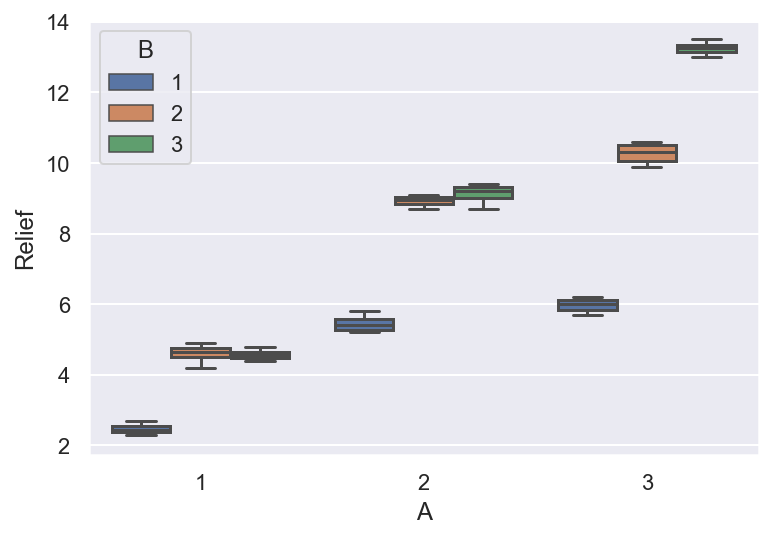

In [23]:
sns.boxplot(x='A', y='Relief', data=fev, hue='B');

<AxesSubplot:xlabel='A', ylabel='Relief'>

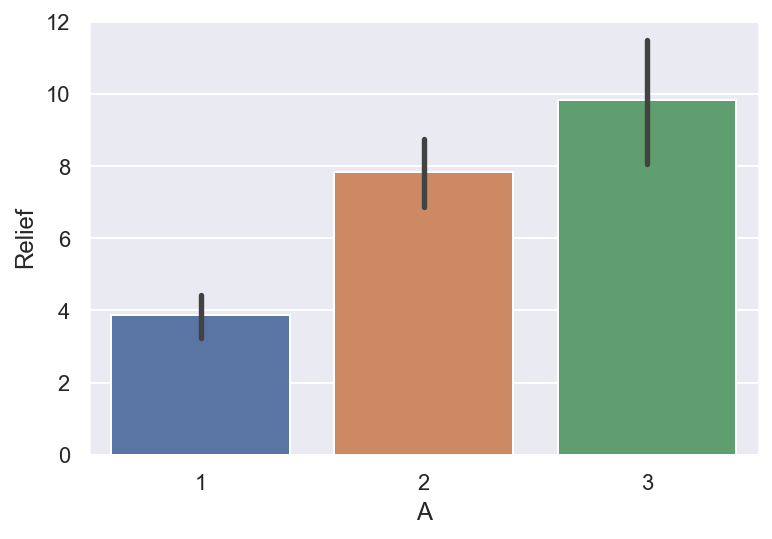

In [24]:
sns.barplot(x="A", y='Relief', data=fev)

<AxesSubplot:xlabel='B', ylabel='Relief'>

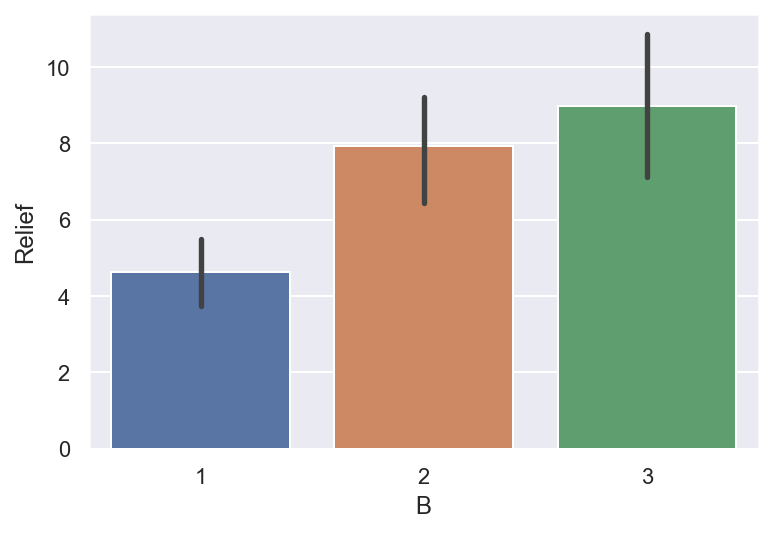

In [25]:
sns.barplot(x="B", y='Relief', data=fev)

<AxesSubplot:xlabel='A', ylabel='Relief'>

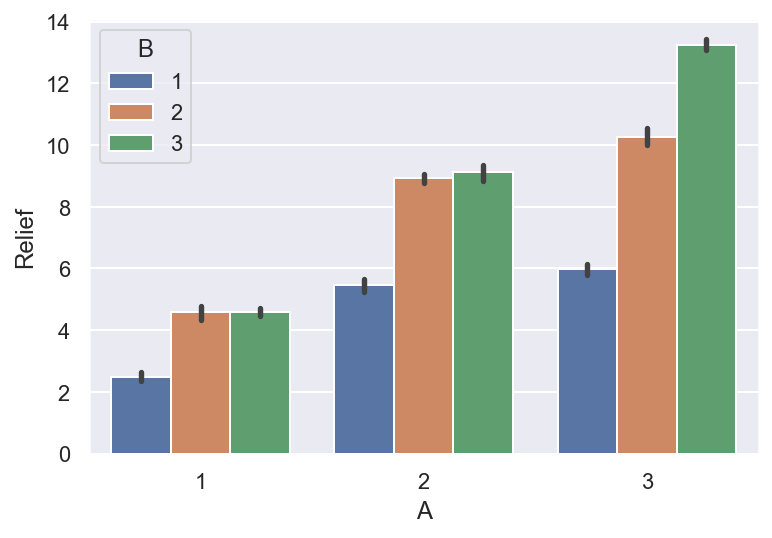

In [26]:
sns.barplot(x="A", y='Relief', data=fev, hue='B')

<AxesSubplot:xlabel='Volunteer', ylabel='Relief'>

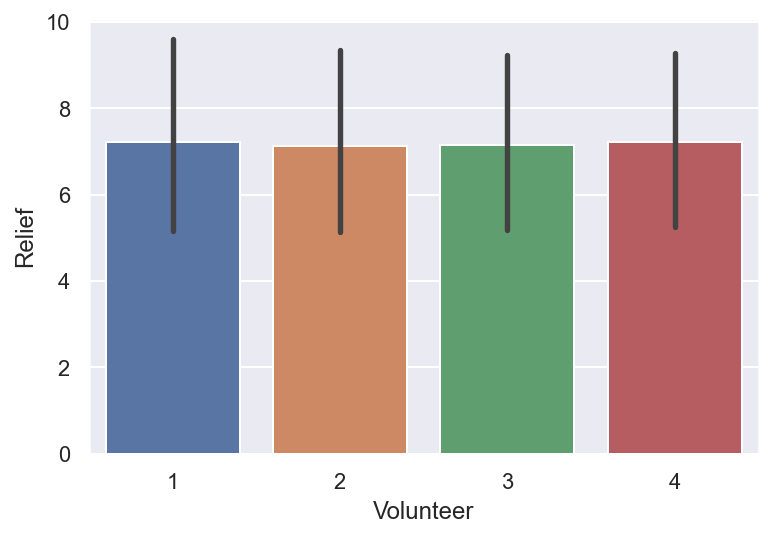

In [27]:
sns.barplot(x="Volunteer", y='Relief', data=fev)

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> Basic Understanding of Data

In [28]:
print('1. Total Number of Records(Volunteers) =', fev.count()[0])
print('2. Study of 2 active ingredients in Compound = A and B')
print(''.ljust(5)+'* Levels of Each Ingredient - 3')
print('3. Number of Volunteers = 4')
print('')
print('4. Response Variable or Dependent Variable = "Relief"')
print('5. Input variables or Independent variables = "A", "B" and "Volunteer"')

1. Total Number of Records(Volunteers) = 36
2. Study of 2 active ingredients in Compound = A and B
     * Levels of Each Ingredient - 3
3. Number of Volunteers = 4

4. Response Variable or Dependent Variable = "Relief"
5. Input variables or Independent variables = "A", "B" and "Volunteer"


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0900ad"> [Q1.1] State the Null and Alternate Hypothesis for conducting one-way ANOVA for both the variables ‘A’ and ‘B’ individually. [both statement and statistical form like Ho=mu, Ha>mu]


### Treatment 1 - Effect of only Ingredient 'A' on 'Relief'

* NULL HYPOTHESIS - $H_o$ : $\mu_{a1} = \mu_{a2} = \mu_{a3}$   (**Mean of the RELEF variable is SAME - due to different levels of Ingredient A**)
* ALTERNATIVE HYPOTHESIS - $H_a$ : **At least One of the Means of RELIEF variable is not same to others - due to different levels of Ingredient A**

### Treatment 2 - Effect of only Ingredient 'B' on 'Relief'

* NULL HYPOTHESIS - $H_o$ : $\mu_{b1} = \mu_{b2} = \mu_{b3}$   (**Mean of the RELEF variable is SAME - due to different levels of Ingredient B***)
* ALTERNATIVE HYPOTHESIS - $H_a$ : **At least One of the Means of RELIEF variable is not same to others - due to different levels of Ingredient B**

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0900ad">  [Q1.2] Perform one-way ANOVA for variable ‘A’ with respect to the variable ‘Relief’. State whether the Null Hypothesis is accepted or rejected based on the ANOVA results.



### ONE WAY ANOVA - Effect of only Ingredient 'A' on 'Relief'

#### STEP 1 : STATE HYPOTHESIS

* NULL HYPOTHESIS - $H_o$ : $\mu_{a1} = \mu_{a2} = \mu_{a3}$   (**Mean of the RELEF variable is SAME - due to different levels of Ingredient A**)
* ALTERNATIVE HYPOTHESIS - $H_a$ : **At least One of the Means of RELIEF variable is not same to others - due to different levels of Ingredient A**

#### STEP 2 : FIT THE FORMULA TO MODEL AND MAKE AN ANOVA TABLE 

In [29]:
formula_a = 'Relief ~ C(A)'
model_a = ols(formula_a, fev).fit()
aov_table_a = anova_lm(model_a)
aov_table_a.to_csv('aov_A.csv')
aov_table_a

,df,sum_sq,mean_sq,F,PR(>F)
C(A),2.0,220.02,110.010000,23.465387,4.578242e-07
Residual,33.0,154.71,4.688182,NaN,NaN


#### STEP 3 : CONCLUDE AND INFER FROM THE ANOVA TABLE

In [30]:
alpha = 0.05
p_value_a = aov_table_a['PR(>F)'][0]
print('Level of Significance, alpha =', alpha)
print('p value =', p_value_a)
print('')
if (p_value_a < alpha):
    print('We have enough evidence to reject the Null Hypothesis')
    print('')
    print('We conclude that Different Levels of of Ingredient A have significant impact on Mean RELIEF.')
    print('There is at east one pair of Means of RELIEF, which is NOT SAME.')
else:
    print('We do not have enough evidence to reject the Null Hypothesis')
    print('')
    print('We conclude that Mean Relief is SAME - due to different levels of Ingredient A')
    print('There is No significant impact on Mean RELIEF due to different levels of Ingredient A')

Level of Significance, alpha = 0.05
p value = 4.5782418430432463e-07

We have enough evidence to reject the Null Hypothesis

We conclude that Different Levels of of Ingredient A have significant impact on Mean RELIEF.
There is at east one pair of Means of RELIEF, which is NOT SAME.


### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#0e92ea"> We conclude that All Levels of "Ingredient A" - DO NOT have the same effect on RELIEF experienced by the patients. 

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0900ad">  [Q1.3] Perform one-way ANOVA for variable ‘B’ with respect to the variable ‘Relief’. State whether the Null Hypothesis is accepted or rejected based on the ANOVA results.


### ONE WAY ANOVA - Effect of only Ingredient 'B' on 'Relief'

#### STEP 1 : STATE HYPOTHESIS

* NULL HYPOTHESIS - $H_o$ : $\mu_{b1} = \mu_{b2} = \mu_{b3}$   (**Mean of the RELEF variable is SAME - due to different levels of Ingredient B**)
* ALTERNATIVE HYPOTHESIS - $H_a$ : **At least One of the Means of RELIEF variable is not same to others - due to different levels of Ingredient B**

#### STEP 2 : FIT THE FORMULA TO MODEL AND MAKE AN ANOVA TABLE 

In [31]:
formula_b = 'Relief ~ C(B)'
model_b = ols(formula_b, fev).fit()
aov_table_b = anova_lm(model_b)
aov_table_b.to_csv('aov_B.csv')
aov_table_b

,df,sum_sq,mean_sq,F,PR(>F)
C(B),2.0,123.66,61.830000,8.126777,0.00135
Residual,33.0,251.07,7.608182,NaN,NaN


#### STEP 3 : CONCLUDE AND INFER FROM THE ANOVA TABLE

In [32]:
alpha = 0.05
p_value_b = aov_table_b['PR(>F)'][0]
print('Level of Significance, alpha =', alpha)
print('p value =', p_value_b)
print('')
if (p_value_b < alpha):
    print('We have enough evidence to reject the Null Hypothesis')
    print('')
    print('We conclude that Different Levels of of Ingredient B have significant impact on Mean RELIEF.')
    print('There is at east one pair of Means of RELIEF, which is NOT SAME.')
else:
    print('We do not have enough evidence to reject the Null Hypothesis')
    print('')
    print('We conclude that Mean Relief is SAME - due to different levels of Ingredient B')
    print('There is No significant impact on Mean RELIEF due to different levels of Ingredient A')

Level of Significance, alpha = 0.05
p value = 0.0013497704987694903

We have enough evidence to reject the Null Hypothesis

We conclude that Different Levels of of Ingredient B have significant impact on Mean RELIEF.
There is at east one pair of Means of RELIEF, which is NOT SAME.


### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#0e92ea"> We conclude that All Levels of "Ingredient B" - DO NOT have the same effect on RELIEF experienced by the patients. 

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0900ad">  [Q1.4] Analyse the effects of one variable on another with the help of an interaction plot. 
### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0900ad">  What is the interaction between the two treatments?
[hint: use the ‘pointplot’ function from the ‘seaborn’ function]

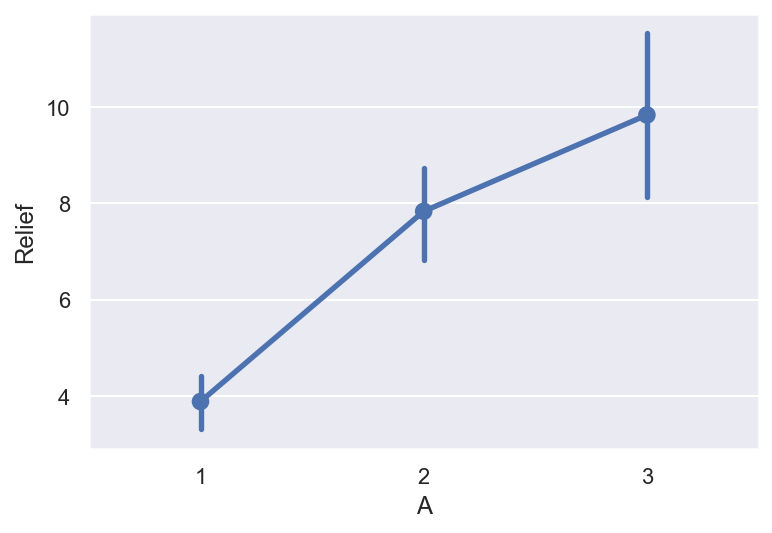

In [33]:
sns.pointplot(x='A', y='Relief', data=fev);

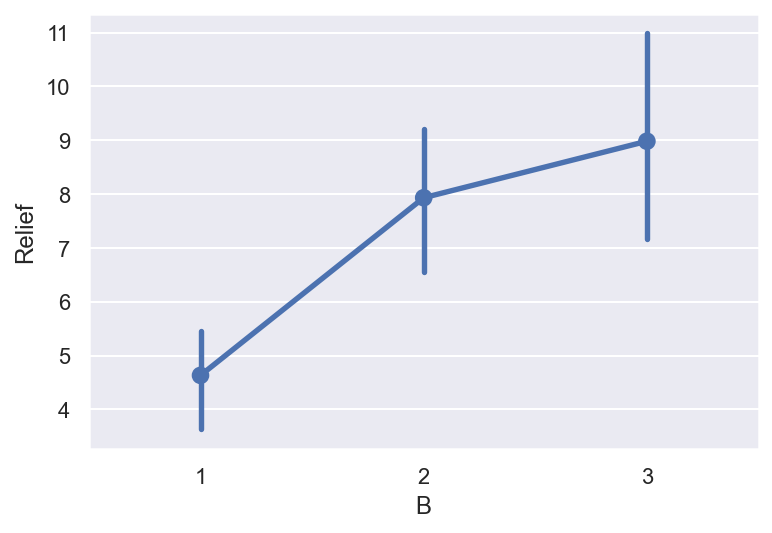

In [34]:
sns.pointplot(x='B', y='Relief', data=fev);

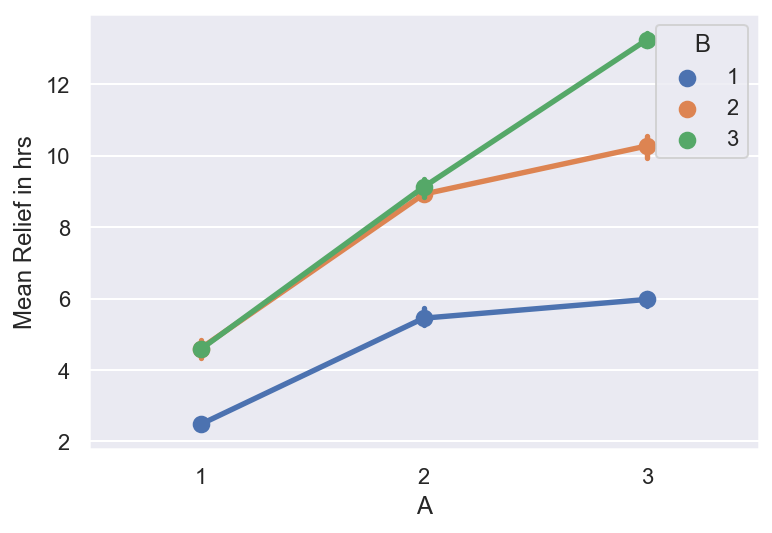

In [35]:
sns.pointplot(x='A', y='Relief', data=fev, hue='B');
plt.ylabel('Mean Relief in hrs')
plt.savefig('pointplot_ab.jpg', bbox_inches='tight');

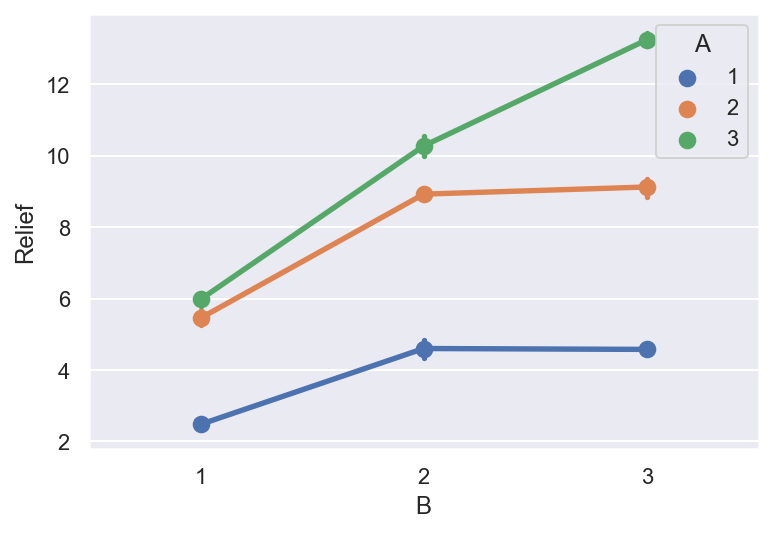

In [36]:
sns.pointplot(x='B', y='Relief', data=fev, hue='A');

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0900ad">  [Q1.5] Perform a two-way ANOVA based on the different ingredients (variable ‘A’ & ‘B’ along with their interaction 'A*B') with the variable 'Relief' and state your results.

### PERFORMING TWO WAY ANOVA - EFFECT OF INGREDIENTS "A" AND "B" AND ITS INTERACTION ON "RELIEF"

### STEP 1 : STATE THE HYPOTHESIS

### Treatment 1 - Effect of Ingredient 'A' on 'Relief'

* NULL HYPOTHESIS - $H_o$ : $\mu_{a1} = \mu_{a2} = \mu_{a3}$   (**Mean of the RELEF variable is SAME - due to different levels of Ingredient A**)
* ALTERNATIVE HYPOTHESIS - $H_a$ : **At least One of the Means of RELIEF variable is not same to others - due to different levels of Ingredient A**

### Treatment 2 - Effect of Ingredient 'B' on 'Relief'

* NULL HYPOTHESIS - $H_o$ : $\mu_{b1} = \mu_{b2} = \mu_{b3}$   (**Mean of the RELEF variable is SAME - due to different levels of Ingredient B**)
* ALTERNATIVE HYPOTHESIS - $H_a$ : **At least One of the Means of RELIEF variable is not same to others - due to different levels of Ingredient B**

### Effect of Interaction between Ingredients A and B on 'Relief'

* NULL HYPOTHESIS - $H_o$ :   **Interaction between Ingredients A and B DOES NOT significantly affect RELIEF variable**
* ALTERNATIVE HYPOTHESIS - $H_a$ : **Interaction between Ingredients A and B significantly affects RELIEF variable**

### STEP 2 : FIT THE FORMULA TO MODEL AND MAKE AN ANOVA TABLE

In [37]:
formula_ab = 'Relief ~ C(A) + C(B) + C(A):C(B)'
model_ab = ols(formula_ab, fev).fit()
aov_table_ab = anova_lm(model_ab)
aov_table_ab.to_csv('aov_AB.csv')
aov_table_ab

,df,sum_sq,mean_sq,F,PR(>F)
C(A),2.0,220.020,110.010000,1827.858462,1.514043e-29
C(B),2.0,123.660,61.830000,1027.329231,3.348751e-26
C(A):C(B),4.0,29.425,7.356250,122.226923,6.972083e-17
Residual,27.0,1.625,0.060185,NaN,NaN


### STEP 3 : CONCLUDE AND INFER FROM THE ANOVA TABLE

In [38]:
alpha = 0.05
p_value_A = aov_table_ab['PR(>F)'][0]
p_value_B = aov_table_ab['PR(>F)'][1]
p_value_AB = aov_table_ab['PR(>F)'][2]
print('p value of A =', p_value_A)
print('p value of B =', p_value_B)
print('p value of Interaction of A and B =', p_value_AB)


p value of A = 1.514043174439273e-29
p value of B = 3.348751243712155e-26
p value of Interaction of A and B = 6.972083272923505e-17


In [39]:
cat =['A', 'B', 'AB']
p = [p_value_A, p_value_B, p_value_AB]
print('Level of Significance, alpha =', alpha)

for i in range(0,3):
    print('')
    if (p[i] < alpha):
        print('p value of INGREDIENT {} ='.format(cat[i]), p[i])
        print('We have enough evidence to reject the Null Hypothesis')
        print('')
        print('We conclude that All Levels of "Ingredient {}" - has significant effect on RELIEF experienced by the patients.'.format(cat[i]))
    else:
        print('p value of INGREDIENT {} ='.format(cat[i]), p[i])
        print('We do not have enough evidence to reject the Null Hypothesis')
        print('')
        print('We conclude that All Levels of "Ingredient {}" - have the same effect on RELIEF experienced by the patients.'.format(cat[i]))



Level of Significance, alpha = 0.05

p value of INGREDIENT A = 1.514043174439273e-29
We have enough evidence to reject the Null Hypothesis

We conclude that All Levels of "Ingredient A" - has significant effect on RELIEF experienced by the patients.

p value of INGREDIENT B = 3.348751243712155e-26
We have enough evidence to reject the Null Hypothesis

We conclude that All Levels of "Ingredient B" - has significant effect on RELIEF experienced by the patients.

p value of INGREDIENT AB = 6.972083272923505e-17
We have enough evidence to reject the Null Hypothesis

We conclude that All Levels of "Ingredient AB" - has significant effect on RELIEF experienced by the patients.


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> Import Libraries

In [40]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
sns.set(color_codes=True)
sns.set_palette('deep')

%config InlineBackend.figure_format ='retina'

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"


## <span style="font-family: Arial; font-weight:bold;font-size:1.4em;color:#0320fc"> Problem 2 - Education Post 12th

<font size=4; color=darkblue>

The dataset Education - Post 12th Standard.csv is a dataset that contains the names of various colleges. This particular case study is based on various parameters of various institutions. You are expected to do Principal Component Analysis for this case study according to the instructions given in the following rubric. The data dictionary of the 'Education - Post 12th Standard.csv' can be found in the following file: Data Dictionary.xlsx.

In [41]:
edu = pd.read_csv('Education - Post 12th Standard-1.csv')
edu.head(5).to_csv('edu_head.csv')
edu.head()

,Names,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Abilene Christian University,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,Adelphi University,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,Adrian College,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,Agnes Scott College,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,Alaska Pacific University,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


In [42]:
edu.tail()

,Names,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
772,Worcester State College,2197,1515,543,4,26,3089,2029,6797,3900,500,1200,60,60,21.0,14,4469,40
773,Xavier University,1959,1805,695,24,47,2849,1107,11520,4960,600,1250,73,75,13.3,31,9189,83
774,Xavier University of Louisiana,2097,1915,695,34,61,2793,166,6900,4200,617,781,67,75,14.4,20,8323,49
775,Yale University,10705,2453,1317,95,99,5217,83,19840,6510,630,2115,96,96,5.8,49,40386,99
776,York College of Pennsylvania,2989,1855,691,28,63,2988,1726,4990,3560,500,1250,75,75,18.1,28,4509,99


In [43]:
edu.shape

(777, 18)

In [44]:
edu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 777 entries, 0 to 776
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Names        777 non-null    object 
 1   Apps         777 non-null    int64  
 2   Accept       777 non-null    int64  
 3   Enroll       777 non-null    int64  
 4   Top10perc    777 non-null    int64  
 5   Top25perc    777 non-null    int64  
 6   F.Undergrad  777 non-null    int64  
 7   P.Undergrad  777 non-null    int64  
 8   Outstate     777 non-null    int64  
 9   Room.Board   777 non-null    int64  
 10  Books        777 non-null    int64  
 11  Personal     777 non-null    int64  
 12  PhD          777 non-null    int64  
 13  Terminal     777 non-null    int64  
 14  S.F.Ratio    777 non-null    float64
 15  perc.alumni  777 non-null    int64  
 16  Expend       777 non-null    int64  
 17  Grad.Rate    777 non-null    int64  
dtypes: float64(1), int64(16), object(1)
memory usage: 

In [45]:
edu.dtypes

Names           object
Apps             int64
Accept           int64
Enroll           int64
Top10perc        int64
Top25perc        int64
F.Undergrad      int64
P.Undergrad      int64
Outstate         int64
Room.Board       int64
Books            int64
Personal         int64
PhD              int64
Terminal         int64
S.F.Ratio      float64
perc.alumni      int64
Expend           int64
Grad.Rate        int64
dtype: object

In [46]:
edu.dtypes.value_counts()

int64      16
float64     1
object      1
dtype: int64

In [47]:
edu.columns

Index(['Names', 'Apps', 'Accept', 'Enroll', 'Top10perc', 'Top25perc',
       'F.Undergrad', 'P.Undergrad', 'Outstate', 'Room.Board', 'Books',
       'Personal', 'PhD', 'Terminal', 'S.F.Ratio', 'perc.alumni', 'Expend',
       'Grad.Rate'],
      dtype='object')

In [48]:
edu.describe().T
edu.describe().T.to_csv('edu_describe.csv')

,count,mean,std,min,25%,50%,75%,max
Apps,777.0,3001.638353,3870.201484,81.0,776.0,1558.0,3624.0,48094.0
Accept,777.0,2018.804376,2451.113971,72.0,604.0,1110.0,2424.0,26330.0
Enroll,777.0,779.972973,929.176190,35.0,242.0,434.0,902.0,6392.0
Top10perc,777.0,27.558559,17.640364,1.0,15.0,23.0,35.0,96.0
Top25perc,777.0,55.796654,19.804778,9.0,41.0,54.0,69.0,100.0
F.Undergrad,777.0,3699.907336,4850.420531,139.0,992.0,1707.0,4005.0,31643.0
P.Undergrad,777.0,855.298584,1522.431887,1.0,95.0,353.0,967.0,21836.0
Outstate,777.0,10440.669241,4023.016484,2340.0,7320.0,9990.0,12925.0,21700.0
Room.Board,777.0,4357.526384,1096.696416,1780.0,3597.0,4200.0,5050.0,8124.0
Books,777.0,549.380952,165.105360,96.0,470.0,500.0,600.0,2340.0


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> Check for Null Values

In [49]:
edu.isnull().sum()

Names          0
Apps           0
Accept         0
Enroll         0
Top10perc      0
Top25perc      0
F.Undergrad    0
P.Undergrad    0
Outstate       0
Room.Board     0
Books          0
Personal       0
PhD            0
Terminal       0
S.F.Ratio      0
perc.alumni    0
Expend         0
Grad.Rate      0
dtype: int64

In [50]:
edu.isnull().sum().any()

False

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> Check for Duplicates

In [51]:
dups1 = edu.duplicated()
sum(dups1)

0

In [52]:
dups1.any()

False

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> Basic Understanding of Data

In [53]:
print('1. Total No. of Records (No. of Colleges in data) =', edu.shape[0])
print('2. Total No. of Variables (No. of Columns) =', edu.shape[1])
print(''.ljust(5)+'a. No. of Continuous Variables = 17')
print(''.ljust(10)+'* Integer data type variables = 16')
print(''.ljust(10)+'* Float data type variables = 1')
print(''.ljust(5)+'b. No. of Categorical Variables = 1')

1. Total No. of Records (No. of Colleges in data) = 777
2. Total No. of Variables (No. of Columns) = 18
     a. No. of Continuous Variables = 17
          * Integer data type variables = 16
          * Float data type variables = 1
     b. No. of Categorical Variables = 1


### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> Uni-Variate Analysis

In [54]:
col = edu.columns
col

Index(['Names', 'Apps', 'Accept', 'Enroll', 'Top10perc', 'Top25perc',
       'F.Undergrad', 'P.Undergrad', 'Outstate', 'Room.Board', 'Books',
       'Personal', 'PhD', 'Terminal', 'S.F.Ratio', 'perc.alumni', 'Expend',
       'Grad.Rate'],
      dtype='object')

In [55]:
edu.skew()

Apps           3.723750
Accept         3.417727
Enroll         2.690465
Top10perc      1.413217
Top25perc      0.259340
F.Undergrad    2.610458
P.Undergrad    5.692353
Outstate       0.509278
Room.Board     0.477356
Books          3.485025
Personal       1.742497
PhD           -0.768170
Terminal      -0.816542
S.F.Ratio      0.667435
perc.alumni    0.606891
Expend         3.459322
Grad.Rate     -0.113777
dtype: float64

In [56]:
# COEFFICIENT OF VARIATION TO CHECK DISPERSION

for i in range(1,18):
    print('CV for {} ='.format(col[i]), round(edu[col[i]].std()*100/edu[col[i]].mean(), 2))
    

CV for Apps = 128.94
CV for Accept = 121.41
CV for Enroll = 119.13
CV for Top10perc = 64.01
CV for Top25perc = 35.49
CV for F.Undergrad = 131.1
CV for P.Undergrad = 178.0
CV for Outstate = 38.53
CV for Room.Board = 25.17
CV for Books = 30.05
CV for Personal = 50.5
CV for PhD = 22.47
CV for Terminal = 18.47
CV for S.F.Ratio = 28.09
CV for perc.alumni = 54.48
CV for Expend = 54.05
CV for Grad.Rate = 26.24


In [57]:
for i in range(1,18):
    print('{}  -------->       Mean = {},    Median = {},    CV = {}'.format(col[i], round(edu[col[i]].mean(), 2), edu[col[i]].median(), round(edu[col[i]].std()*100/edu[col[i]].mean(), 2)))

Apps  -------->       Mean = 3001.64,    Median = 1558.0,    CV = 128.94
Accept  -------->       Mean = 2018.8,    Median = 1110.0,    CV = 121.41
Enroll  -------->       Mean = 779.97,    Median = 434.0,    CV = 119.13
Top10perc  -------->       Mean = 27.56,    Median = 23.0,    CV = 64.01
Top25perc  -------->       Mean = 55.8,    Median = 54.0,    CV = 35.49
F.Undergrad  -------->       Mean = 3699.91,    Median = 1707.0,    CV = 131.1
P.Undergrad  -------->       Mean = 855.3,    Median = 353.0,    CV = 178.0
Outstate  -------->       Mean = 10440.67,    Median = 9990.0,    CV = 38.53
Room.Board  -------->       Mean = 4357.53,    Median = 4200.0,    CV = 25.17
Books  -------->       Mean = 549.38,    Median = 500.0,    CV = 30.05
Personal  -------->       Mean = 1340.64,    Median = 1200.0,    CV = 50.5
PhD  -------->       Mean = 72.66,    Median = 75.0,    CV = 22.47
Terminal  -------->       Mean = 79.7,    Median = 82.0,    CV = 18.47
S.F.Ratio  -------->       Mean = 14.09, 

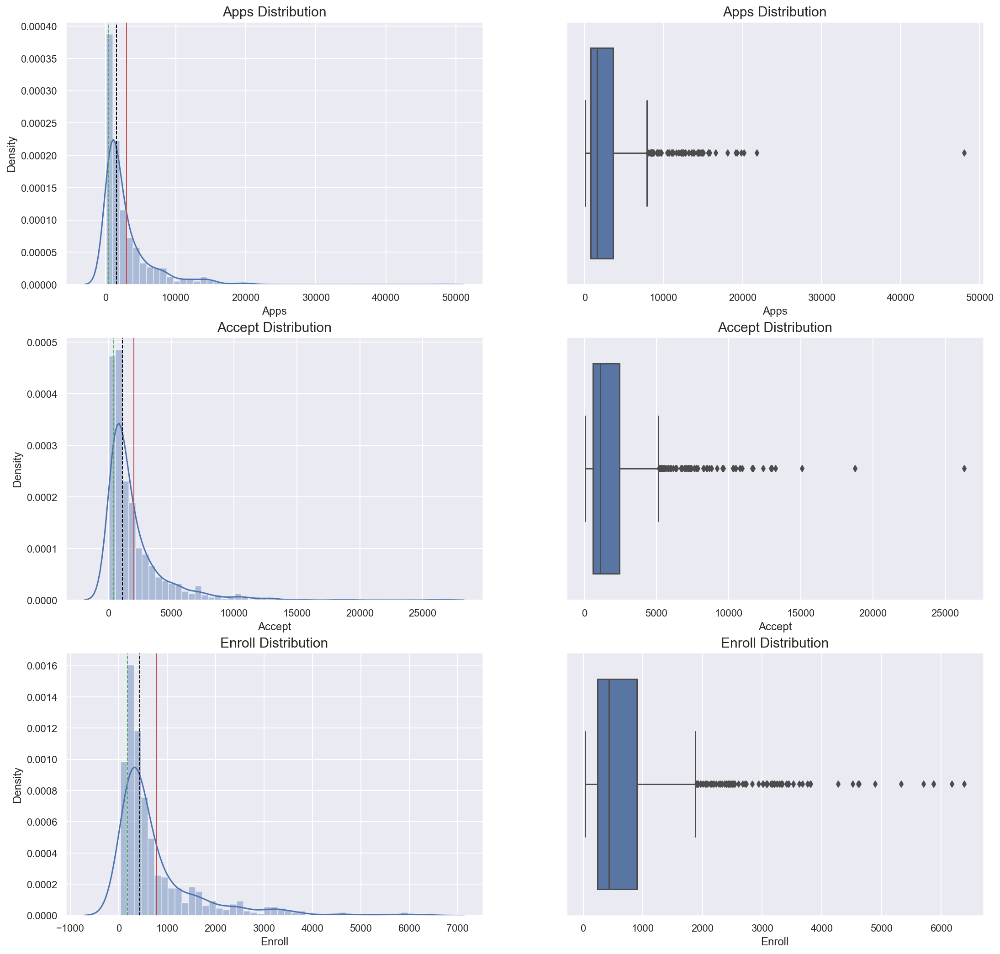

In [58]:
# UNIVARIATE ANALYSIS GROUP-WISE
# DIST-PLOT WITH KDE AND BOXPLOT

# GROUP 1 - APPLICATIONS

fig, axes = plt.subplots(nrows=3,ncols=2);

fig.set_size_inches(18, 18);

for i in range(1,4):
    a = sns.distplot(edu[col[i]], ax=axes[i-1][0]);
    a.set_title('{} Distribution'.format(col[i]), fontsize=15);
    a.axvline(edu[col[i]].mean(), color='r', linewidth=1);
    a.axvline(edu[col[i]].median(), color='black', linestyle='dashed', linewidth=1);
    a.axvline(edu[col[i]].mode()[0], color='g', linestyle='dashed', linewidth=1);
    
    
    a = sns.boxplot(edu[col[i]], orient = "v" , ax=axes[i-1][1]);
    a.set_title('{} Distribution'.format(col[i]), fontsize=15);
    
plt.savefig('g1.jpg', bbox_inches='tight');

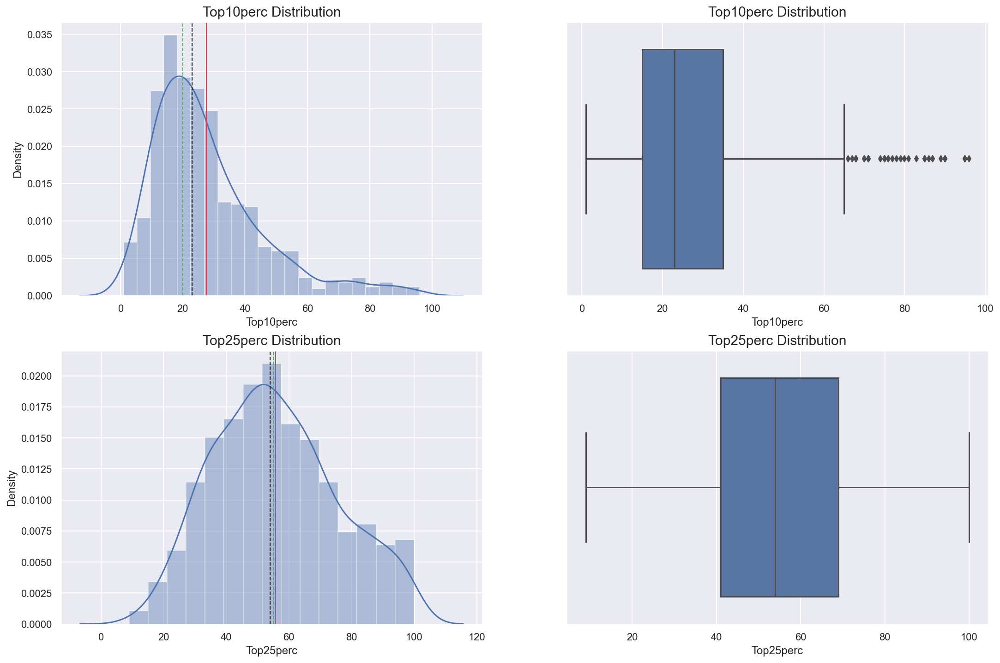

In [59]:
# UNIVARIATE ANALYSIS GROUP-WISE
# DIST-PLOT WITH KDE AND BOXPLOT

# GROUP 2 - QUALITY OF ENROLMENTS

fig, axes = plt.subplots(nrows=2,ncols=2);

fig.set_size_inches(18, 12);

for i in range(4,6):
    a = sns.distplot(edu[col[i]], ax=axes[i-4][0]);
    a.set_title('{} Distribution'.format(col[i]), fontsize=15);
    a.axvline(edu[col[i]].mean(), color='r', linewidth=1);
    a.axvline(edu[col[i]].median(), color='black', linestyle='dashed', linewidth=1);
    a.axvline(edu[col[i]].mode()[0], color='g', linestyle='dashed', linewidth=1);
    
    a = sns.boxplot(edu[col[i]], orient = "v" , ax=axes[i-4][1]);
    a.set_title('{} Distribution'.format(col[i]), fontsize=15);
    
plt.savefig('g2.jpg', bbox_inches='tight');

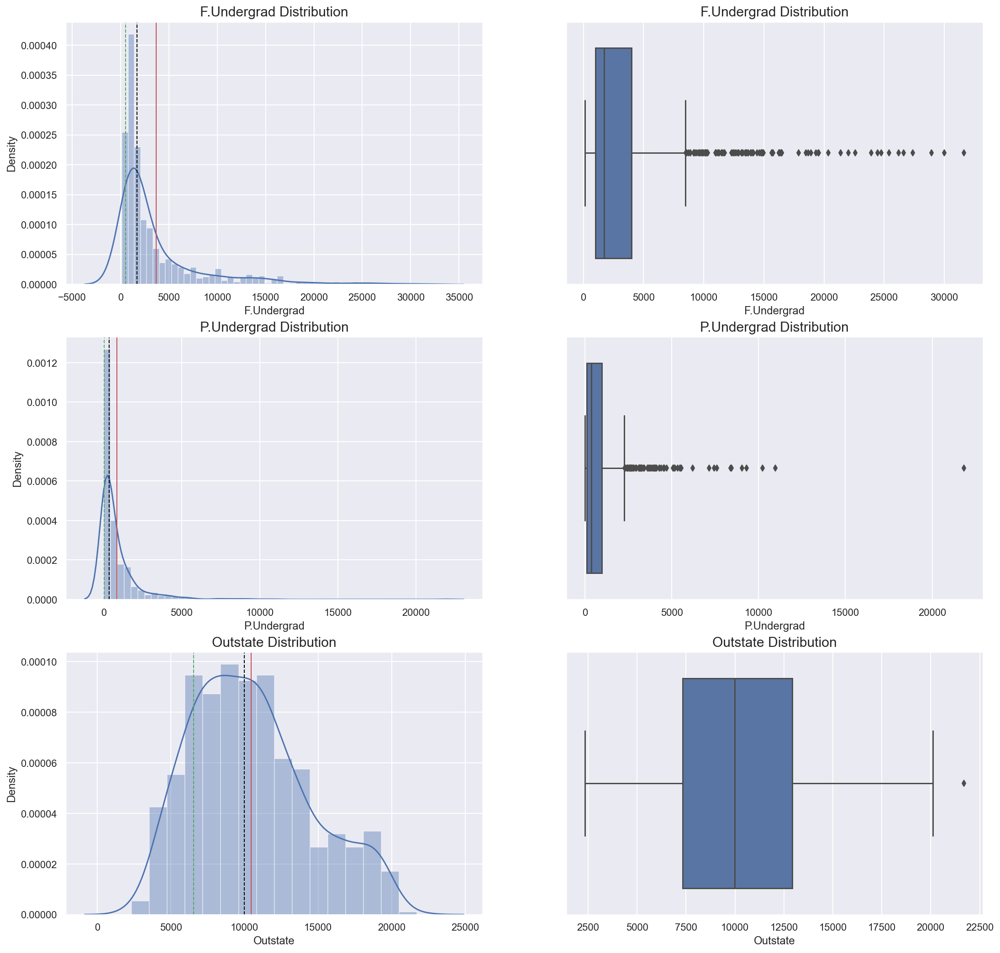

In [60]:
# UNIVARIATE ANALYSIS GROUP-WISE
# DIST-PLOT WITH KDE AND BOXPLOT

# GROUP 3 - ENROLLED STUDENTS' TYPE

fig, axes = plt.subplots(nrows=3,ncols=2);

fig.set_size_inches(18, 18);

for i in range(6,9):
    a = sns.distplot(edu[col[i]], ax=axes[i-6][0]);
    a.set_title('{} Distribution'.format(col[i]), fontsize=15);
    a.axvline(edu[col[i]].mean(), color='r', linewidth=1);
    a.axvline(edu[col[i]].median(), color='black', linestyle='dashed', linewidth=1);
    a.axvline(edu[col[i]].mode()[0], color='g', linestyle='dashed', linewidth=1);
    
    a = sns.boxplot(edu[col[i]], orient = "v" , ax=axes[i-6][1]);
    a.set_title('{} Distribution'.format(col[i]), fontsize=15);
    
plt.savefig('g3.jpg', bbox_inches='tight');

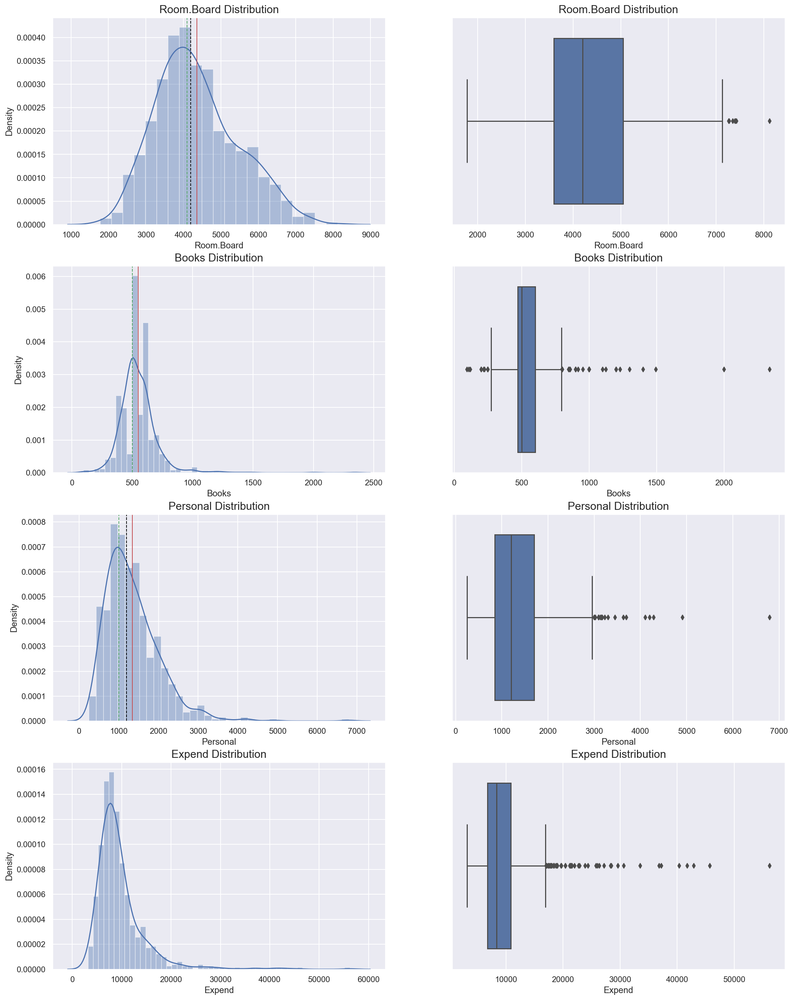

In [61]:
# UNIVARIATE ANALYSIS GROUP-WISE
# DIST-PLOT WITH KDE AND BOXPLOT

# GROUP 4 - EXPENSES

fig, axes = plt.subplots(nrows=4,ncols=2);

fig.set_size_inches(18, 24);

for i in range(9,12):
    a = sns.distplot(edu[col[i]], ax=axes[i-9][0]);
    a.set_title('{} Distribution'.format(col[i]), fontsize=15);
    a.axvline(edu[col[i]].mean(), color='r', linewidth=1);
    a.axvline(edu[col[i]].median(), color='black', linestyle='dashed', linewidth=1);
    a.axvline(edu[col[i]].mode()[0], color='g', linestyle='dashed', linewidth=1);
    
    a = sns.boxplot(edu[col[i]], orient = "v" , ax=axes[i-9][1]);
    a.set_title('{} Distribution'.format(col[i]), fontsize=15);
    
a = sns.distplot(edu[col[16]], ax=axes[3][0]);
a.set_title('{} Distribution'.format(col[16]), fontsize=15);

a = sns.boxplot(edu[col[16]], orient = "v" , ax=axes[3][1]);
a.set_title('{} Distribution'.format(col[16]), fontsize=15);

plt.savefig('g4.jpg', bbox_inches='tight');

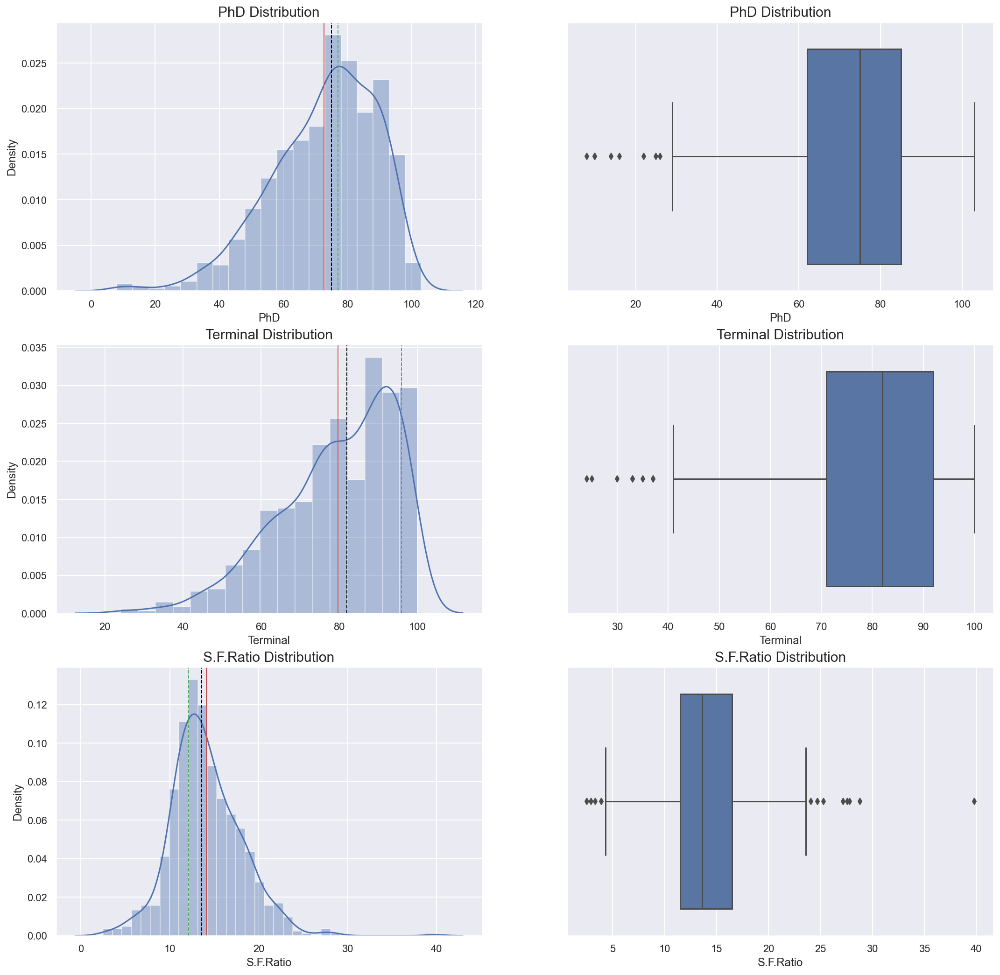

In [62]:
# UNIVARIATE ANALYSIS GROUP-WISE
# DIST-PLOT WITH KDE AND BOXPLOT

# GROUP 5 - FACULTY AND STUDENT FACULTY RATIO

fig, axes = plt.subplots(nrows=3,ncols=2);

fig.set_size_inches(18, 18);

for i in range(12,15):
    a = sns.distplot(edu[col[i]], ax=axes[i-12][0]);
    a.set_title('{} Distribution'.format(col[i]), fontsize=15);
    a.axvline(edu[col[i]].mean(), color='r', linewidth=1);
    a.axvline(edu[col[i]].median(), color='black', linestyle='dashed', linewidth=1);
    a.axvline(edu[col[i]].mode()[0], color='g', linestyle='dashed', linewidth=1);
    
    a = sns.boxplot(edu[col[i]], orient = "v" , ax=axes[i-12][1]);
    a.set_title('{} Distribution'.format(col[i]), fontsize=15);
    
plt.savefig('g5.jpg', bbox_inches='tight');

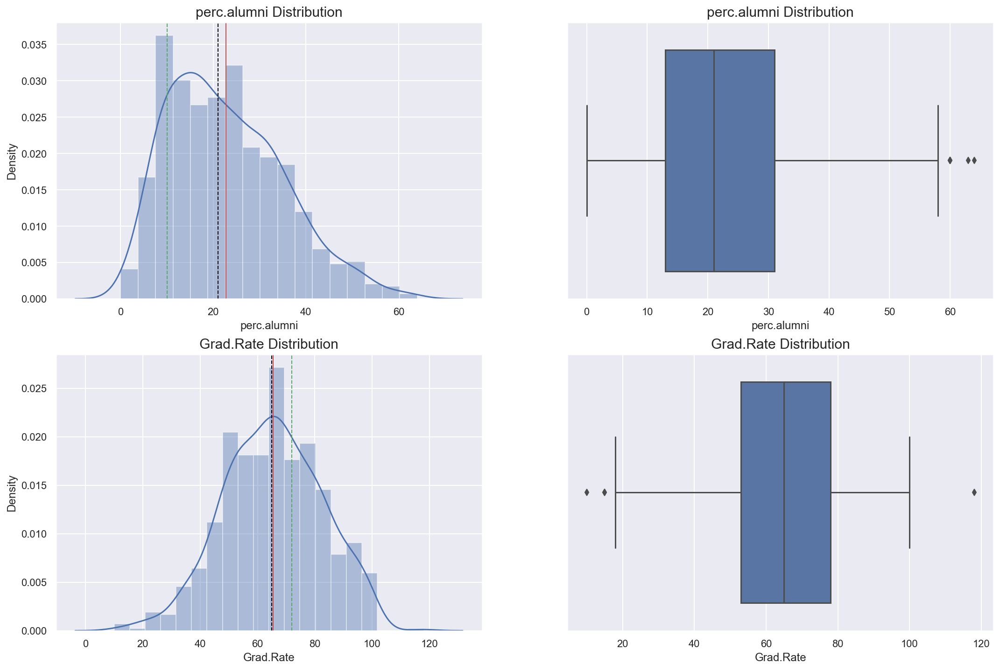

In [63]:
# UNIVARIATE ANALYSIS GROUP-WISE
# DIST-PLOT WITH KDE AND BOXPLOT

# GROUP 6 - OTHERS - PERCENTAGE ALUMNI WHO DONATE AND GRAD RATE

fig, axes = plt.subplots(nrows=2,ncols=2);

fig.set_size_inches(18, 12);

a = sns.distplot(edu[col[15]], ax=axes[0][0]);
a.set_title('{} Distribution'.format(col[15]), fontsize=15);
a.axvline(edu[col[15]].mean(), color='r', linewidth=1);
a.axvline(edu[col[15]].median(), color='black', linestyle='dashed', linewidth=1);
a.axvline(edu[col[15]].mode()[0], color='g', linestyle='dashed', linewidth=1);

a = sns.boxplot(edu[col[15]], orient = "v" , ax=axes[0][1]);
a.set_title('{} Distribution'.format(col[15]), fontsize=15);
    
a = sns.distplot(edu[col[17]], ax=axes[1][0]);
a.set_title('{} Distribution'.format(col[17]), fontsize=15);
a.axvline(edu[col[17]].mean(), color='r', linewidth=1);
a.axvline(edu[col[17]].median(), color='black', linestyle='dashed', linewidth=1);
a.axvline(edu[col[17]].mode()[0], color='g', linestyle='dashed', linewidth=1);

a = sns.boxplot(edu[col[17]], orient = "v" , ax=axes[1][1]);
a.set_title('{} Distribution'.format(col[17]), fontsize=15);

plt.savefig('g6.jpg', bbox_inches='tight');

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> Multi-Variate Analysis

In [64]:
# FOR MULTI-VARIATE ANALYSIS
# DROP THE COLUMN 'NAMES'

edu1 = edu.drop('Names', axis=1)
edu1.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


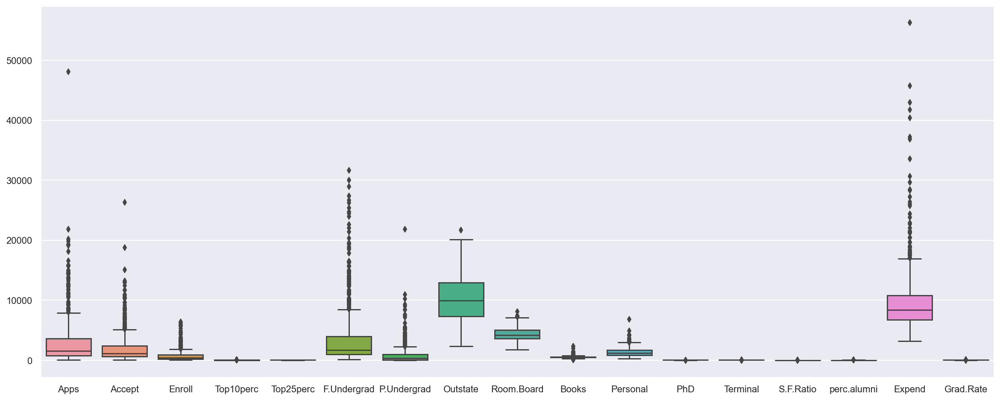

In [65]:
plt.figure(figsize=[20,8]);
sns.boxplot(data=edu1);

In [66]:
sns.pairplot(edu1, diag_kind='kde', aspect=1.5);
plt.savefig('pairplot.jpg', bbox_inches='tight');

In [67]:
corr_edu = edu1.corr()
corr_edu.round(2)

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Apps,1.00,0.94,0.85,0.34,0.35,0.81,0.40,0.05,0.16,0.13,0.18,0.39,0.37,0.10,-0.09,0.26,0.15
Accept,0.94,1.00,0.91,0.19,0.25,0.87,0.44,-0.03,0.09,0.11,0.20,0.36,0.34,0.18,-0.16,0.12,0.07
Enroll,0.85,0.91,1.00,0.18,0.23,0.96,0.51,-0.16,-0.04,0.11,0.28,0.33,0.31,0.24,-0.18,0.06,-0.02
Top10perc,0.34,0.19,0.18,1.00,0.89,0.14,-0.11,0.56,0.37,0.12,-0.09,0.53,0.49,-0.38,0.46,0.66,0.49
Top25perc,0.35,0.25,0.23,0.89,1.00,0.20,-0.05,0.49,0.33,0.12,-0.08,0.55,0.52,-0.29,0.42,0.53,0.48
F.Undergrad,0.81,0.87,0.96,0.14,0.20,1.00,0.57,-0.22,-0.07,0.12,0.32,0.32,0.30,0.28,-0.23,0.02,-0.08
P.Undergrad,0.40,0.44,0.51,-0.11,-0.05,0.57,1.00,-0.25,-0.06,0.08,0.32,0.15,0.14,0.23,-0.28,-0.08,-0.26
Outstate,0.05,-0.03,-0.16,0.56,0.49,-0.22,-0.25,1.00,0.65,0.04,-0.30,0.38,0.41,-0.55,0.57,0.67,0.57
Room.Board,0.16,0.09,-0.04,0.37,0.33,-0.07,-0.06,0.65,1.00,0.13,-0.20,0.33,0.37,-0.36,0.27,0.50,0.42
Books,0.13,0.11,0.11,0.12,0.12,0.12,0.08,0.04,0.13,1.00,0.18,0.03,0.10,-0.03,-0.04,0.11,0.00


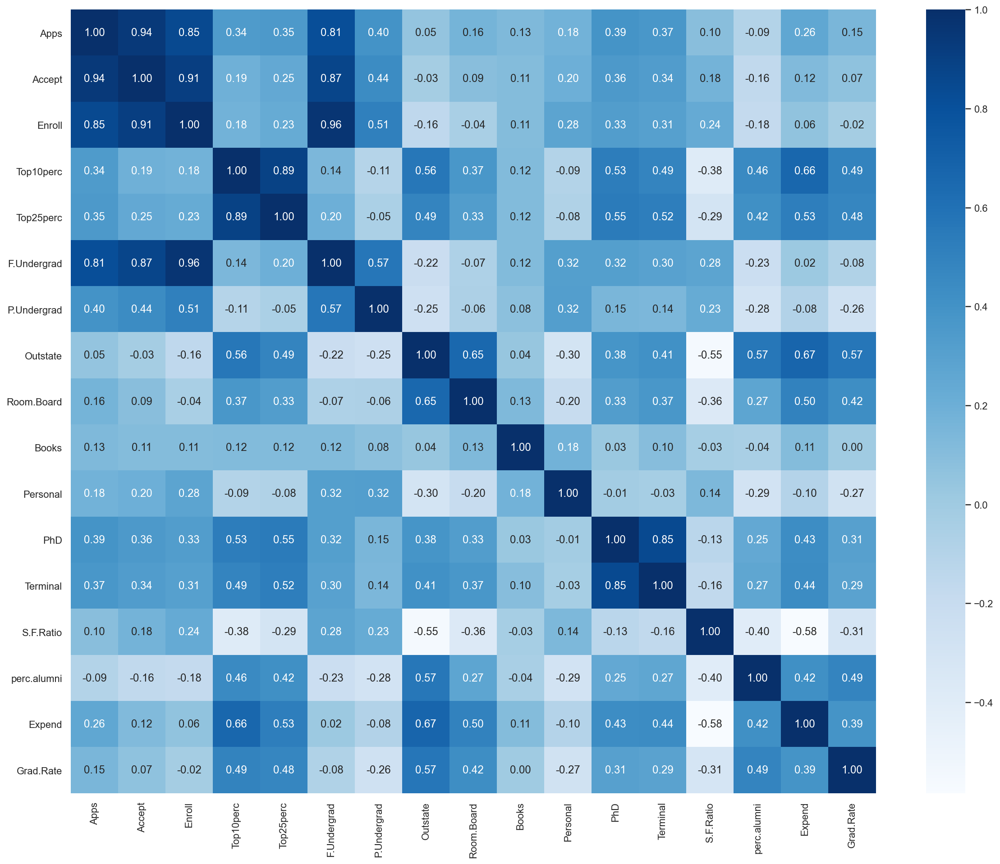

In [68]:
plt.figure(figsize=[20,16])
sns.heatmap(corr_edu, annot=True, fmt='.2f',cmap='Blues');
plt.savefig('corr_heatmap.jpg', bbox_inches='tight');

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> Outlier Treatment Using IQR

In [69]:
# Outlier treatment :  define a custom function- 
# If for a particular column the max value is greater than the Upper end of the Whisker
# Then, assign Upper End of the Whisker to the max value

# Use the Same Logic for the min value

# Upper end of Whisker = Q3 + 1.5*IQR
# Lower End of Whisker = Q1 - 1.5*IQR

def remove_outlier(col1):
    sorted(col1)
    Q1,Q3=col1.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range    

In [70]:
edu_out = edu1.copy()
edu_out.head()
edu_out.columns.value_counts().sum()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


17

In [71]:
# Treating outliers for every Column

for i in range(1,18):
    lr,ur=remove_outlier(edu_out[col[i]])
    edu_out[col[i]]=np.where(edu_out[col[i]]>ur, ur, edu_out[col[i]])
    edu_out[col[i]]=np.where(edu_out[col[i]]<lr, lr, edu_out[col[i]])

In [72]:
edu_out.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,1660.0,1232.0,721.0,23.0,52.0,2885.0,537.0,7440.0,3300.0,450.0,2200.0,70.0,78.0,18.1,12.0,7041.0,60.0
1,2186.0,1924.0,512.0,16.0,29.0,2683.0,1227.0,12280.0,6450.0,750.0,1500.0,29.0,39.5,12.2,16.0,10527.0,56.0
2,1428.0,1097.0,336.0,22.0,50.0,1036.0,99.0,11250.0,3750.0,400.0,1165.0,53.0,66.0,12.9,30.0,8735.0,54.0
3,417.0,349.0,137.0,60.0,89.0,510.0,63.0,12960.0,5450.0,450.0,875.0,92.0,97.0,7.7,37.0,16948.5,59.0
4,193.0,146.0,55.0,16.0,44.0,249.0,869.0,7560.0,4120.0,795.0,1500.0,76.0,72.0,11.9,2.0,10922.0,15.5


### <span style="font-family: Arial; font-weight:bold;font-size:0.9em;color:#0e92ea"> Boxplot of Data Before Outlier Treatment

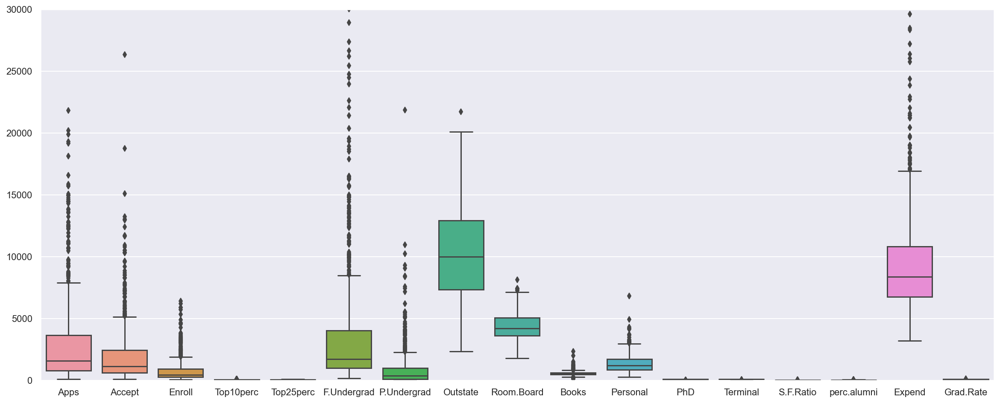

In [73]:
# Boxplot of data BEFORE OUTLIER TREATMENT

plt.figure(figsize=[20,8]);
sns.boxplot(data=edu1);
plt.ylim(0,30000);
plt.savefig('box_before_out-treat.jpg', bbox_inches='tight');

### <span style="font-family: Arial; font-weight:bold;font-size:0.9em;color:#0e92ea"> Standard Scaling WITHOUT OUTLIER TREATMENT

In [74]:
# STANDARD SCALING DATA WITHOUT OUTLIER TREATMENT

from scipy.stats import zscore

data_z = edu1.apply(zscore)
data_z.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,-0.346882,-0.321205,-0.063509,-0.258583,-0.191827,-0.168116,-0.209207,-0.746356,-0.964905,-0.602312,1.270045,-0.163028,-0.115729,1.013776,-0.867574,-0.501910,-0.318252
1,-0.210884,-0.038703,-0.288584,-0.655656,-1.353911,-0.209788,0.244307,0.457496,1.909208,1.215880,0.235515,-2.675646,-3.378176,-0.477704,-0.544572,0.166110,-0.551262
2,-0.406866,-0.376318,-0.478121,-0.315307,-0.292878,-0.549565,-0.497090,0.201305,-0.554317,-0.905344,-0.259582,-1.204845,-0.931341,-0.300749,0.585935,-0.177290,-0.667767
3,-0.668261,-0.681682,-0.692427,1.840231,1.677612,-0.658079,-0.520752,0.626633,0.996791,-0.602312,-0.688173,1.185206,1.175657,-1.615274,1.151188,1.792851,-0.376504
4,-0.726176,-0.764555,-0.780735,-0.655656,-0.596031,-0.711924,0.009005,-0.716508,-0.216723,1.518912,0.235515,0.204672,-0.523535,-0.553542,-1.675079,0.241803,-2.939613


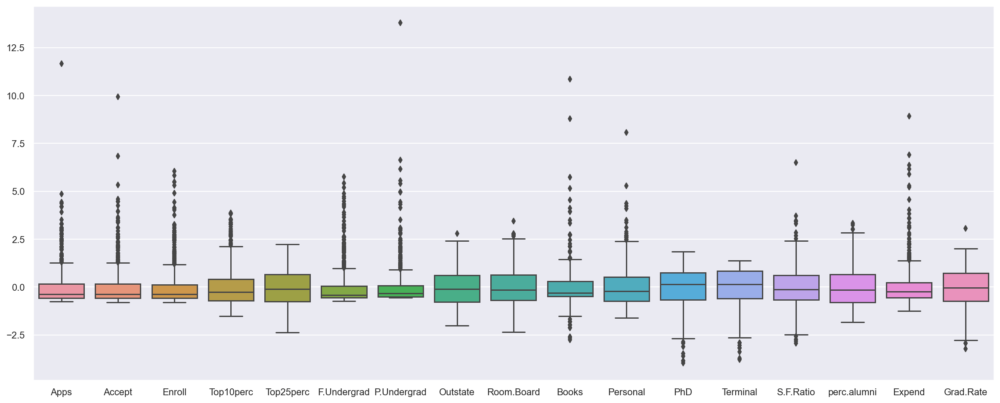

In [75]:
# Boxplot of STANDARD SCALED DATA (Without Outlier Treatment)

plt.figure(figsize=[20,8]);
sns.boxplot(data=data_z);
plt.savefig('box_zscored_without_Out.jpg', bbox_inches='tight');

### <span style="font-family: Arial; font-weight:bold;font-size:0.9em;color:#0e92ea"> MinMax Scaling WITHOUT OUTLIER TREATMENT

In [76]:
# MINMAX SCALING

from sklearn.preprocessing import MinMaxScaler
minmax_scale = MinMaxScaler()

data_minmax = edu1.copy()
coll = data_minmax.columns

for i in range(0,17):
    data_minmax[coll[i]] = minmax_scale.fit_transform(data_minmax[[coll[i]]])

data_minmax.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,0.032887,0.044177,0.107913,0.231579,0.472527,0.087164,0.024548,0.263430,0.239596,0.157754,0.297710,0.652632,0.710526,0.418231,0.187500,0.072671,0.462963
1,0.043842,0.070531,0.075035,0.157895,0.219780,0.080752,0.056148,0.513430,0.736129,0.291444,0.190840,0.221053,0.078947,0.260054,0.250000,0.138387,0.425926
2,0.028055,0.039036,0.047349,0.221053,0.450549,0.028473,0.004488,0.460227,0.310530,0.135472,0.139695,0.473684,0.552632,0.278820,0.468750,0.104605,0.407407
3,0.006998,0.010549,0.016045,0.621053,0.879121,0.011776,0.002839,0.548554,0.578499,0.157754,0.095420,0.884211,0.960526,0.139410,0.578125,0.298415,0.453704
4,0.002333,0.002818,0.003146,0.157895,0.384615,0.003492,0.039753,0.269628,0.368852,0.313725,0.190840,0.715789,0.631579,0.252011,0.031250,0.145833,0.046296


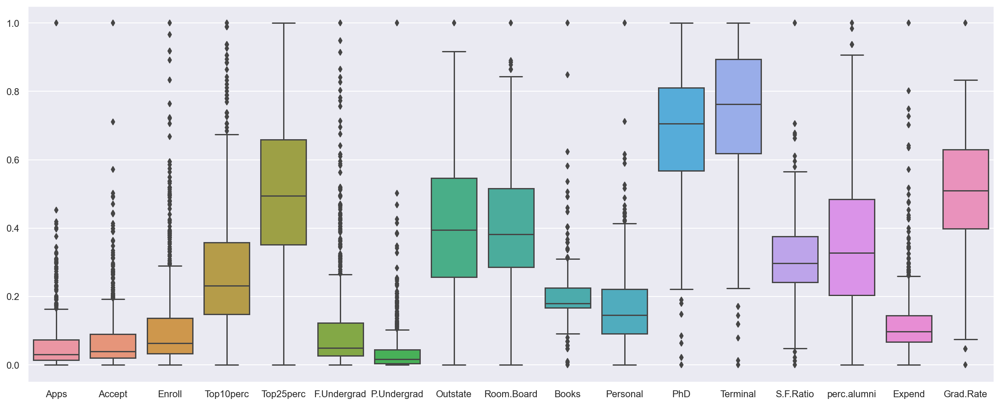

In [77]:
# Boxplot MINMAX SCALED DATA (Without Outlier treatment)

plt.figure(figsize=[20,8]);
sns.boxplot(data=data_minmax);
plt.savefig('box_minmax_without_Out.jpg', bbox_inches='tight');

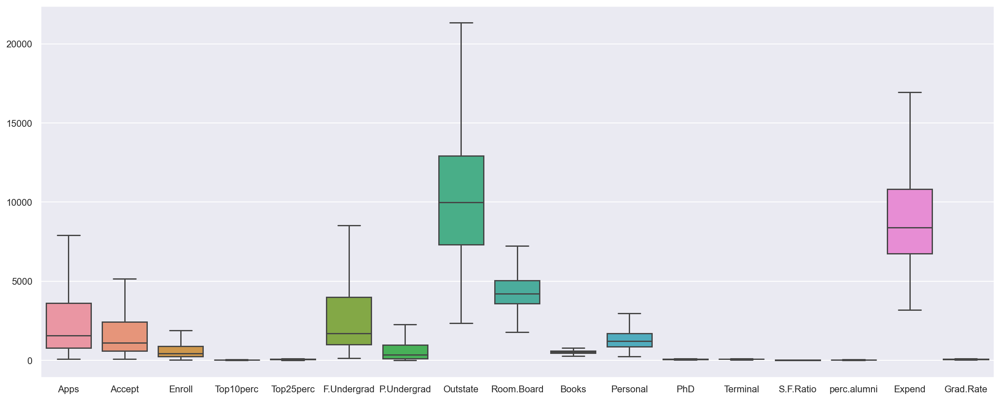

In [78]:
# Boxplot of data AFTER OUTLIER TREATMENT

plt.figure(figsize=[20,8]);
sns.boxplot(data=edu_out);

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> PRINCIPLE COMPONENT ANALYSIS

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#0e92ea"> STEP 1 - STANDARDISING ALL 17 CONTINUOUS VARS USING ZSCORE

In [79]:
# ALL VARIABLES MUST BE ON SAME SCALE TO PERFORM PCA
# HENCE STANDARDISING USING ZSCORE
# FOR PCA - OUTLIER TREATMENT IS RECOMMENDED
# HENCE, WE APPLY ZSCORE ON TREATED DATAFRAME - edu_out

from scipy.stats import zscore

data_new = edu_out.apply(zscore)
data_new.head().to_csv('data_new.csv')
data_new.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,-0.376493,-0.337830,0.106380,-0.246780,-0.191827,-0.018769,-0.166083,-0.746480,-0.968324,-0.776567,1.438500,-0.174045,-0.123239,1.070602,-0.870466,-0.630916,-0.319205
1,-0.159195,0.116744,-0.260441,-0.696290,-1.353911,-0.093626,0.797856,0.457762,1.921680,1.828605,0.289289,-2.745731,-2.785068,-0.489511,-0.545726,0.396097,-0.552693
2,-0.472336,-0.426511,-0.569343,-0.310996,-0.292878,-0.703966,-0.777974,0.201488,-0.555466,-1.210762,-0.260691,-1.240354,-0.952900,-0.304413,0.590864,-0.131845,-0.669437
3,-0.889994,-0.917871,-0.918613,2.129202,1.677612,-0.898889,-0.828267,0.626954,1.004218,-0.776567,-0.736792,1.205884,1.190391,-1.679429,1.159159,2.287940,-0.377577
4,-0.982532,-1.051221,-1.062533,-0.696290,-0.596031,-0.995610,0.297726,-0.716623,-0.216006,2.219381,0.289289,0.202299,-0.538069,-0.568839,-1.682316,0.512468,-2.916759


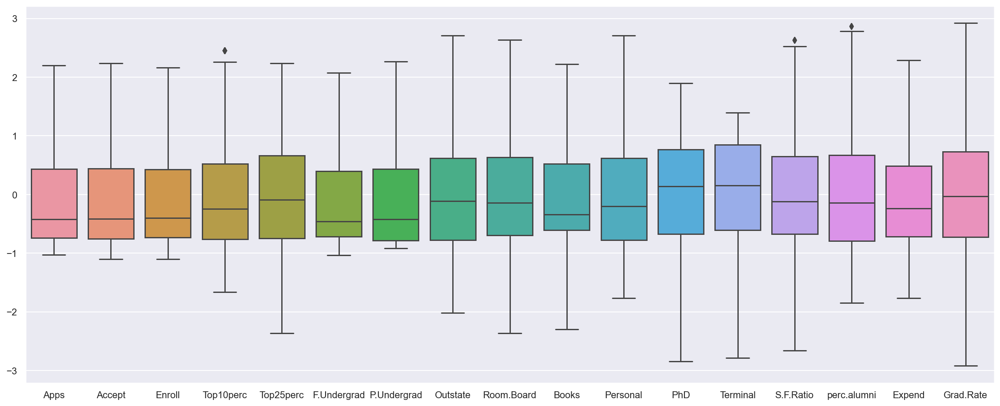

In [80]:
plt.figure(figsize=[20,8])
sns.boxplot(data=data_new);

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#0e92ea"> STEP 2 - CREATE COVARIANCE MATRIX

In [81]:
cov_edu = data_new.cov()
cov_edu

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Apps,1.001289,0.956538,0.898039,0.321756,0.364961,0.862111,0.520493,0.065421,0.187717,0.236442,0.230244,0.464522,0.435038,0.126574,-0.101288,0.243248,0.150998
Accept,0.956538,1.001289,0.936482,0.223586,0.274033,0.898190,0.573429,-0.005009,0.119740,0.208974,0.256676,0.427891,0.403929,0.188749,-0.165729,0.162017,0.079084
Enroll,0.898039,0.936482,1.001289,0.171977,0.230731,0.968549,0.642422,-0.155856,-0.023876,0.202317,0.339785,0.382031,0.354836,0.274622,-0.223010,0.054291,-0.023281
Top10perc,0.321756,0.223586,0.171977,1.001289,0.915053,0.111358,-0.180241,0.562884,0.357826,0.153650,-0.116880,0.544749,0.507401,-0.388426,0.456384,0.657886,0.494307
Top25perc,0.364961,0.274033,0.230731,0.915053,1.001289,0.181429,-0.099423,0.490200,0.331413,0.169980,-0.086922,0.552172,0.528334,-0.297616,0.417369,0.573643,0.479602
F.Undergrad,0.862111,0.898190,0.968549,0.111358,0.181429,1.001289,0.697027,-0.226457,-0.054546,0.208147,0.360246,0.362030,0.335486,0.324922,-0.285825,0.000371,-0.082345
P.Undergrad,0.520493,0.573429,0.642422,-0.180241,-0.099423,0.697027,1.001289,-0.354673,-0.067725,0.122686,0.344496,0.127827,0.122309,0.371085,-0.419874,-0.202189,-0.265499
Outstate,0.065421,-0.005009,-0.155856,0.562884,0.490200,-0.226457,-0.354673,1.001289,0.656334,0.005117,-0.326029,0.391825,0.413110,-0.574422,0.566465,0.776327,0.573196
Room.Board,0.187717,0.119740,-0.023876,0.357826,0.331413,-0.054546,-0.067725,0.656334,1.001289,0.109065,-0.219837,0.341909,0.379759,-0.376915,0.272744,0.581370,0.426339
Books,0.236442,0.208974,0.202317,0.153650,0.169980,0.208147,0.122686,0.005117,0.109065,1.001289,0.240172,0.136566,0.159523,-0.008547,-0.042887,0.150177,-0.008061


In [82]:
corr_edu_z = data_new.corr()
corr_edu_z

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Apps,1.000000,0.955307,0.896883,0.321342,0.364491,0.861002,0.519823,0.065337,0.187475,0.236138,0.229948,0.463924,0.434478,0.126411,-0.101158,0.242935,0.150803
Accept,0.955307,1.000000,0.935277,0.223298,0.273681,0.897034,0.572691,-0.005002,0.119586,0.208705,0.256346,0.427341,0.403409,0.188506,-0.165516,0.161808,0.078982
Enroll,0.896883,0.935277,1.000000,0.171756,0.230434,0.967302,0.641595,-0.155655,-0.023846,0.202057,0.339348,0.381540,0.354379,0.274269,-0.222723,0.054221,-0.023251
Top10perc,0.321342,0.223298,0.171756,1.000000,0.913875,0.111215,-0.180009,0.562160,0.357366,0.153452,-0.116730,0.544048,0.506748,-0.387926,0.455797,0.657039,0.493670
Top25perc,0.364491,0.273681,0.230434,0.913875,1.000000,0.181196,-0.099295,0.489569,0.330987,0.169761,-0.086810,0.551461,0.527654,-0.297233,0.416832,0.572905,0.478985
F.Undergrad,0.861002,0.897034,0.967302,0.111215,0.181196,1.000000,0.696130,-0.226166,-0.054476,0.207879,0.359783,0.361564,0.335054,0.324504,-0.285457,0.000371,-0.082239
P.Undergrad,0.519823,0.572691,0.641595,-0.180009,-0.099295,0.696130,1.000000,-0.354216,-0.067638,0.122529,0.344053,0.127663,0.122152,0.370607,-0.419334,-0.201929,-0.265158
Outstate,0.065337,-0.005002,-0.155655,0.562160,0.489569,-0.226166,-0.354216,1.000000,0.655489,0.005110,-0.325609,0.391321,0.412579,-0.573683,0.565736,0.775328,0.572458
Room.Board,0.187475,0.119586,-0.023846,0.357366,0.330987,-0.054476,-0.067638,0.655489,1.000000,0.108924,-0.219554,0.341469,0.379270,-0.376430,0.272393,0.580622,0.425790
Books,0.236138,0.208705,0.202057,0.153452,0.169761,0.207879,0.122529,0.005110,0.108924,1.000000,0.239863,0.136390,0.159318,-0.008536,-0.042832,0.149983,-0.008051


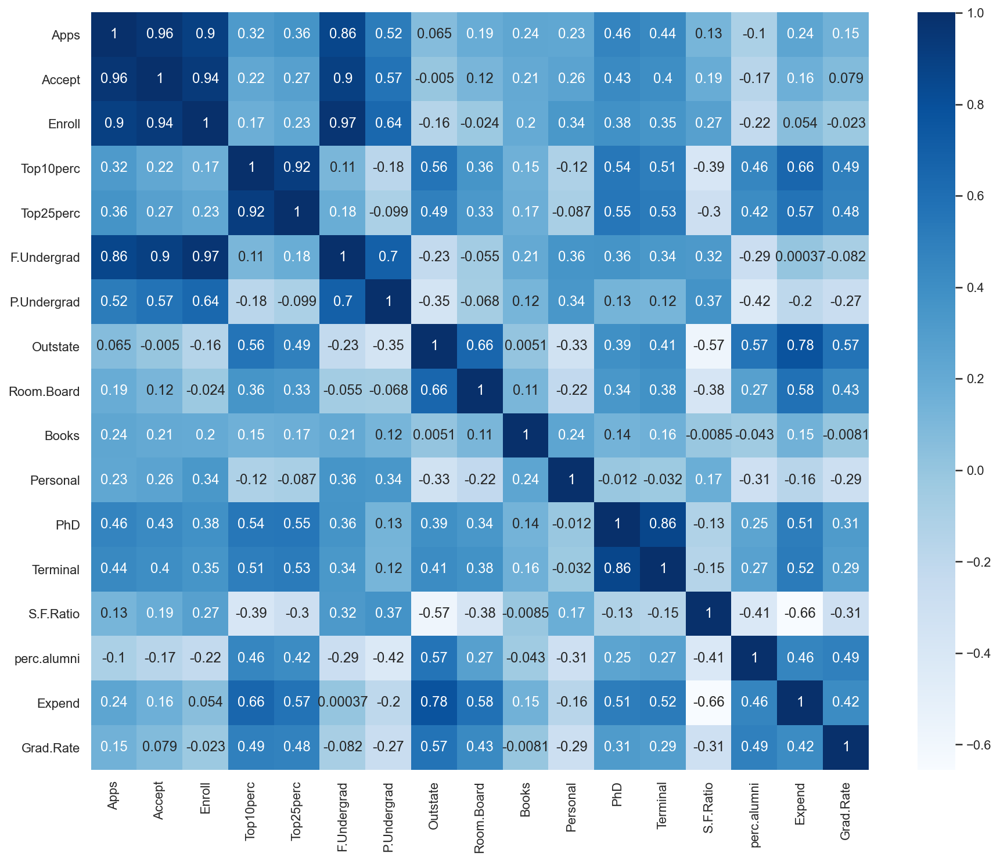

In [83]:
# COVARIANCE MATRIX AFTER SCALING

plt.figure(figsize=[15,12]);
sns.heatmap(cov_edu, annot=True, cmap='Blues');
plt.savefig('cov_after_scaling.jpg', bbox_inches='tight');

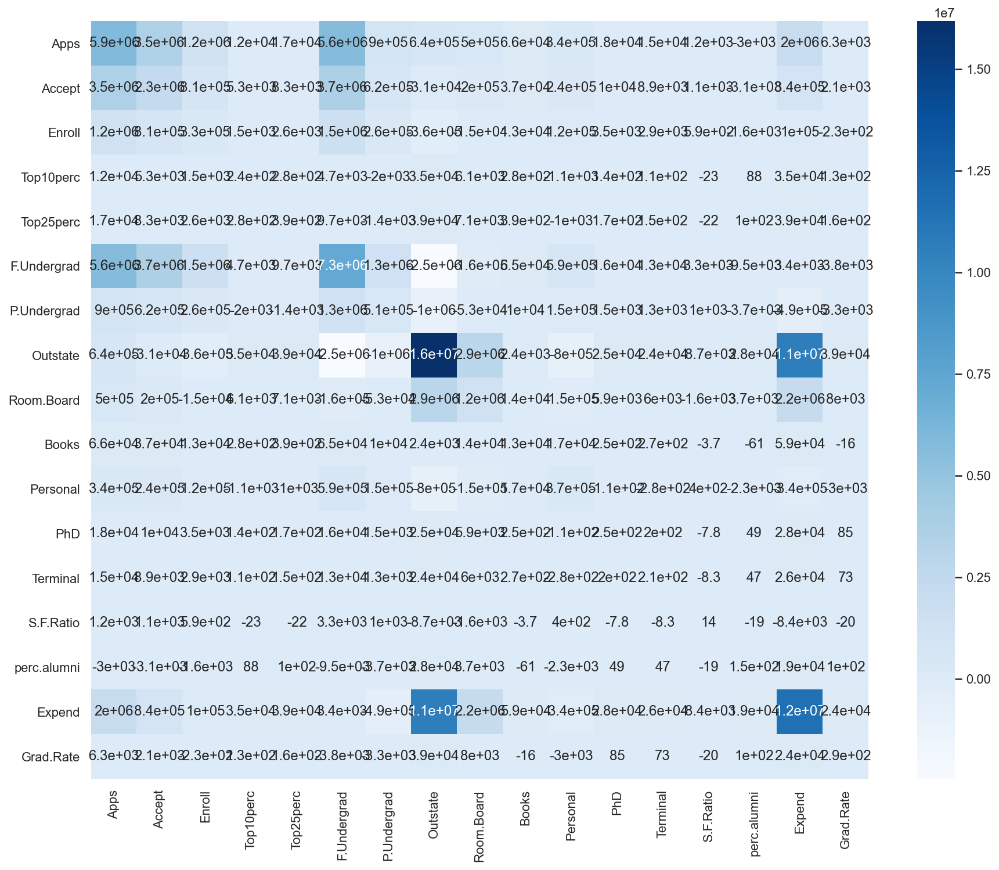

In [84]:
# COVARIANCE MATRIX BEFORE SCALING

plt.figure(figsize=[15,12]);
sns.heatmap(edu_out.cov(), annot=True, cmap='Blues');
plt.savefig('cov_before_scaling.jpg', bbox_inches='tight');

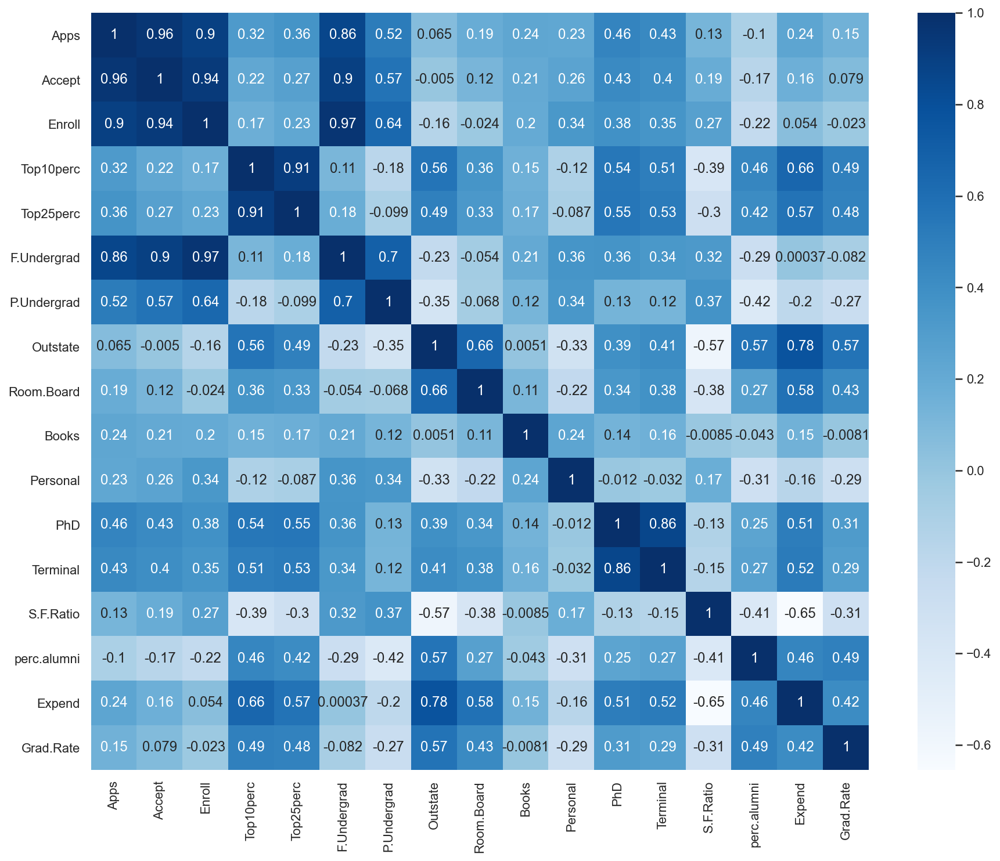

In [85]:
# CORRELATION MATRIX AFTER SCALING

plt.figure(figsize=[15,12]);
sns.heatmap(corr_edu_z, annot=True, cmap='Blues');
plt.savefig('corr_after_scaling.jpg', bbox_inches='tight');

<font size=3; color=darkblue>
    
* It can be observed that,
            
    1. Covariance Matrix of Standardised Variables = Correlation matrix
    
    2. Correlation Matrix of Standardised Vars = Correlation Matrix of Non Standardised Vars
    
    
* We can state that below given three approaches yield the same eigenvectors and eigenvalue pairs:
    
    1.Eigen decomposition of the covariance matrix after standardizing the data.
    
    2.Eigen decomposition of the correlation matrix.
    
    3.Eigen decomposition of the correlation matrix after standardizing the data.

    
</font>

### <span style="font-family: Arial; font-weight:bold;font-size:1em;color:#0e92ea"> STEP 3 - GET EIGEN VALUES AND EIGEN VECTORS

### <span style="font-family: Arial; font-weight:bold;font-size:0.9em;color:#0e92ea"> USING LINALG

In [86]:
eig_val, eig_vct = np.linalg.eig(cov_edu)
print('Eigen Values are -\n', eig_val.round(3))
print('')
print('Eigen Vectors are -\n', eig_vct.round(3))

Eigen Values are -
 [5.663 4.895 1.126 1.004 0.872 0.766 0.585 0.545 0.424 0.381 0.247 0.022
 0.038 0.147 0.134 0.099 0.075]

Eigen Vectors are -
 [[-0.262  0.314  0.081 -0.099 -0.22   0.002 -0.028 -0.09   0.131 -0.156
  -0.086  0.182 -0.599  0.09   0.089  0.549  0.005]
 [-0.231  0.345  0.108 -0.118 -0.19  -0.017 -0.013 -0.138  0.142 -0.149
  -0.043 -0.391  0.661  0.159  0.044  0.292  0.014]
 [-0.189  0.383  0.086 -0.009 -0.162 -0.068 -0.015 -0.144  0.051 -0.065
  -0.044  0.717  0.233 -0.035 -0.062 -0.417 -0.05 ]
 [-0.339 -0.099 -0.079  0.369 -0.157 -0.089 -0.257  0.29  -0.122 -0.036
   0.002 -0.056  0.022 -0.039  0.07   0.009 -0.724]
 [-0.335 -0.06  -0.051  0.417 -0.144 -0.028 -0.239  0.346 -0.194  0.006
  -0.102  0.02   0.032  0.146 -0.097 -0.011  0.655]
 [-0.163  0.399  0.074 -0.014 -0.103 -0.052 -0.031 -0.109  0.001 -0.
  -0.035 -0.543 -0.368 -0.134 -0.087 -0.571  0.025]
 [-0.022  0.358  0.04  -0.225  0.096 -0.025 -0.01   0.124 -0.635  0.546
   0.252  0.03   0.026  0.05   0.045  0.

### <span style="font-family: Arial; font-weight:bold;font-size:0.9em;color:#0e92ea"> Cummulative Distribution of Eigen values

In [87]:
tot = np.sum(eig_val)
e = sorted(eig_val, reverse=True)
var_exp = [i*100/tot for i in e]
cum = np.cumsum(var_exp)
cum.round(3)

array([ 33.266,  62.021,  68.639,  74.537,  79.661,  84.159,  87.596,
        90.794,  93.282,  95.521,  96.972,  97.837,  98.626,  99.207,
        99.646,  99.868, 100.   ])

### <span style="font-family: Arial; font-weight:bold;font-size:0.9em;color:#0e92ea"> SCREE Plot

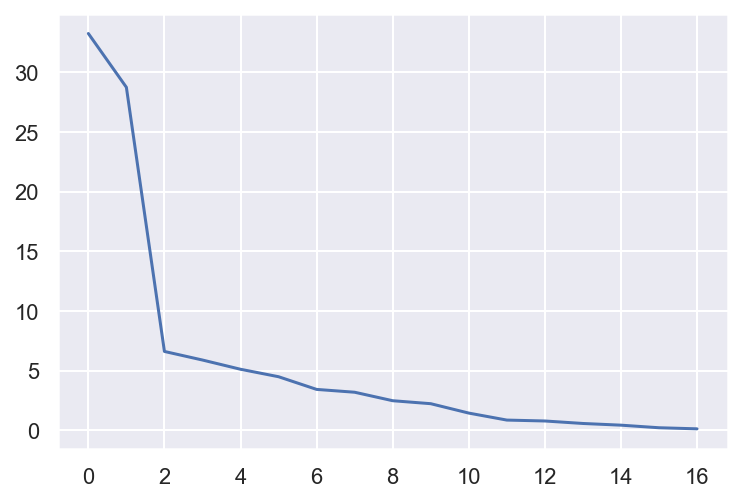

In [88]:
plt.plot(var_exp);
plt.savefig('scree.jpg', bbox_inches='tight');

<font size=3; color=darkblue>
    
* Visually we can observe that there is steep drop in variance explained with increase in number of PC's.

* We will proceed with 5 components here. 

* We ll assume approx 80% variance

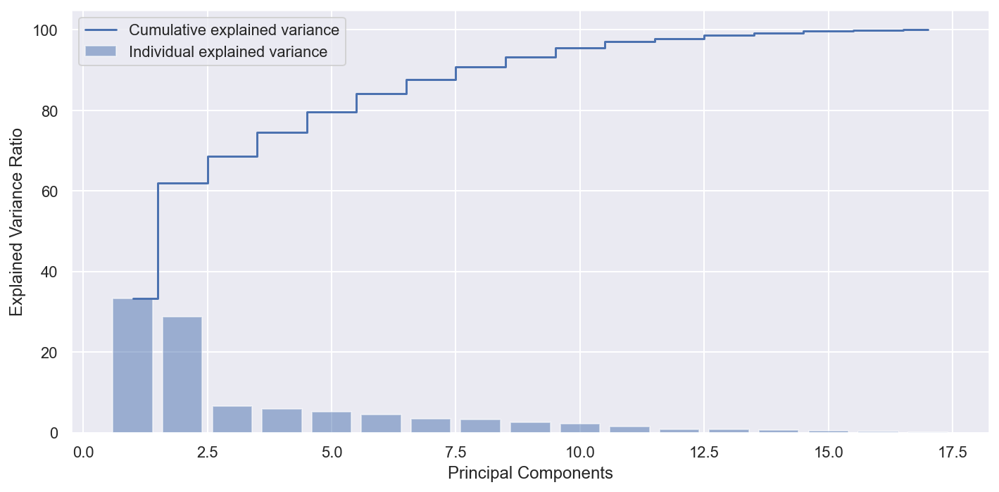

In [89]:

plt.figure(figsize=(10 , 5))
plt.bar(range(1, eig_val.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, eig_val.size + 1), cum, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show();

### <span style="font-family: Arial; font-weight:bold;font-size:0.9em;color:#0e92ea"> USING SCIKIT LEARN TO FIND PRINCIPAL COMPONENTS

In [90]:
from sklearn.decomposition import PCA

# NOTE - we are generating only 5 PCA dimensions (dimensionality reduction from 18 to 4)

pca = PCA(n_components=17)
data_reduced = pca.fit_transform(data_new)
data_reduced.transpose()

array([[-1.60249937e+00, -1.80467545e+00, -1.60828257e+00, ...,
        -5.76882673e-01,  6.57095200e+00, -4.77393067e-01],
       [ 9.93683013e-01, -7.04149922e-02, -1.38279212e+00, ...,
         1.77984611e-02, -1.18493014e+00,  1.04394672e+00],
       [ 3.00447636e-02,  2.12212752e+00, -5.01512552e-01, ...,
         3.22160336e-01,  1.32596561e+00, -1.42543835e+00],
       ...,
       [ 3.09482851e-03, -3.24329699e-01,  7.30303781e-02, ...,
        -1.62407776e-01, -9.64378943e-02, -5.59570376e-03],
       [-3.06898585e-02, -1.63392355e-01, -2.36336429e-02, ...,
        -2.70575811e-01,  9.57356063e-01, -6.78126913e-02],
       [-1.47130758e-01,  1.92958540e-01,  4.32362016e-03, ...,
         3.87433636e-02, -4.55356845e-01, -4.89303358e-02]])

In [91]:
data_reduced.shape

(777, 17)

In [92]:
pca.components_.round(3)

array([[ 0.262,  0.231,  0.189,  0.339,  0.335,  0.163,  0.022,  0.284,
         0.244,  0.097, -0.035,  0.326,  0.323, -0.163,  0.187,  0.329,
         0.239],
       [ 0.314,  0.345,  0.383, -0.099, -0.06 ,  0.399,  0.358, -0.252,
        -0.132,  0.094,  0.232,  0.055,  0.043,  0.26 , -0.257, -0.16 ,
        -0.168],
       [-0.081, -0.108, -0.086,  0.079,  0.051, -0.074, -0.04 , -0.015,
         0.021,  0.697,  0.531, -0.081, -0.059, -0.274, -0.104,  0.184,
        -0.245],
       [ 0.099,  0.118,  0.009, -0.369, -0.417,  0.014,  0.225,  0.263,
         0.581, -0.036, -0.115, -0.147, -0.089, -0.259, -0.224,  0.214,
        -0.036],
       [ 0.22 ,  0.19 ,  0.162,  0.157,  0.144,  0.103, -0.096,  0.037,
        -0.069,  0.035, -0.   , -0.551, -0.59 , -0.143,  0.128, -0.022,
         0.357],
       [ 0.002, -0.017, -0.068, -0.089, -0.028, -0.052, -0.025, -0.02 ,
         0.237,  0.639, -0.381,  0.003,  0.035,  0.469,  0.013, -0.232,
         0.314],
       [-0.028, -0.013, -0.015, -0

In [93]:
df_pca = pd.DataFrame(pca.components_.round(3),
                     columns=['EV1', 'EV2', 'EV3', 'EV4', 'EV5', 'EV6', 'EV7', 'EV8', 'EV9', 'EV10', 'EV11', 'EV12', 'EV13', 'EV14', 'EV15', 'EV16', 'EV17'],
                     index=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17'])

df_pca1 = df_pca.T
df_pca1
df_pca1.to_csv('df_pca.csv')

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17
EV1,0.262,0.314,-0.081,0.099,0.220,0.002,-0.028,-0.090,-0.131,-0.156,-0.086,-0.090,-0.089,-0.549,0.005,0.599,-0.182
EV2,0.231,0.345,-0.108,0.118,0.190,-0.017,-0.013,-0.138,-0.142,-0.149,-0.043,-0.159,-0.044,-0.292,0.014,-0.661,0.391
EV3,0.189,0.383,-0.086,0.009,0.162,-0.068,-0.015,-0.144,-0.051,-0.065,-0.044,0.035,0.062,0.417,-0.050,-0.233,-0.717
EV4,0.339,-0.099,0.079,-0.369,0.157,-0.089,-0.257,0.290,0.122,-0.036,0.002,0.039,-0.070,-0.009,-0.724,-0.022,0.056
EV5,0.335,-0.060,0.051,-0.417,0.144,-0.028,-0.239,0.346,0.194,0.006,-0.102,-0.146,0.097,0.011,0.655,-0.032,-0.020
EV6,0.163,0.399,-0.074,0.014,0.103,-0.052,-0.031,-0.109,-0.001,-0.000,-0.035,0.134,0.087,0.571,0.025,0.368,0.543
EV7,0.022,0.358,-0.040,0.225,-0.096,-0.025,-0.010,0.124,0.635,0.546,0.252,-0.050,-0.045,-0.146,-0.040,-0.026,-0.030
EV8,0.284,-0.252,-0.015,0.263,0.037,-0.020,0.095,0.011,0.008,-0.232,0.593,-0.560,-0.067,0.212,-0.002,0.081,-0.001
EV9,0.244,-0.132,0.021,0.581,-0.069,0.237,0.095,0.390,0.221,-0.255,-0.475,0.107,-0.018,0.101,-0.028,-0.027,-0.010
EV10,0.097,0.094,0.697,-0.036,0.035,0.639,-0.111,-0.240,-0.021,0.091,0.044,-0.052,-0.035,0.029,-0.008,-0.010,-0.004


In [94]:
pca.explained_variance_ratio_

array([0.33266084, 0.28755345, 0.06617164, 0.05898144, 0.05123893,
       0.04498639, 0.03436243, 0.03198847, 0.02488108, 0.02238396,
       0.01451157, 0.00865143, 0.00789247, 0.00580627, 0.00438788,
       0.00222619, 0.00131558])

In [95]:
pca.explained_variance_

array([5.6625219 , 4.89470815, 1.12636744, 1.00397659, 0.87218426,
       0.7657541 , 0.58491404, 0.5445048 , 0.42352336, 0.38101777,
       0.24701456, 0.14726392, 0.13434483, 0.09883384, 0.07469003,
       0.03789395, 0.02239369])

In [96]:
#cumulative sum of variance explained with [n] features

cum1 = np.cumsum(np.round(pca.explained_variance_ratio_, decimals=3)*100)
cum1

array([ 33.3,  62.1,  68.7,  74.6,  79.7,  84.2,  87.6,  90.8,  93.3,
        95.5,  97. ,  97.9,  98.7,  99.3,  99.7,  99.9, 100. ])

### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#0e92ea"> CORRELATION BETWEEN COMPONENTS AND FEATURES

In [97]:
df_pc_comp = df_pca.copy()
df_pc_comp.columns = list(data_new )
df_pc_comp.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
PC1,0.262,0.231,0.189,0.339,0.335,0.163,0.022,0.284,0.244,0.097,-0.035,0.326,0.323,-0.163,0.187,0.329,0.239
PC2,0.314,0.345,0.383,-0.099,-0.060,0.399,0.358,-0.252,-0.132,0.094,0.232,0.055,0.043,0.260,-0.257,-0.160,-0.168
PC3,-0.081,-0.108,-0.086,0.079,0.051,-0.074,-0.040,-0.015,0.021,0.697,0.531,-0.081,-0.059,-0.274,-0.104,0.184,-0.245
PC4,0.099,0.118,0.009,-0.369,-0.417,0.014,0.225,0.263,0.581,-0.036,-0.115,-0.147,-0.089,-0.259,-0.224,0.214,-0.036
PC5,0.220,0.190,0.162,0.157,0.144,0.103,-0.096,0.037,-0.069,0.035,-0.000,-0.551,-0.590,-0.143,0.128,-0.022,0.357


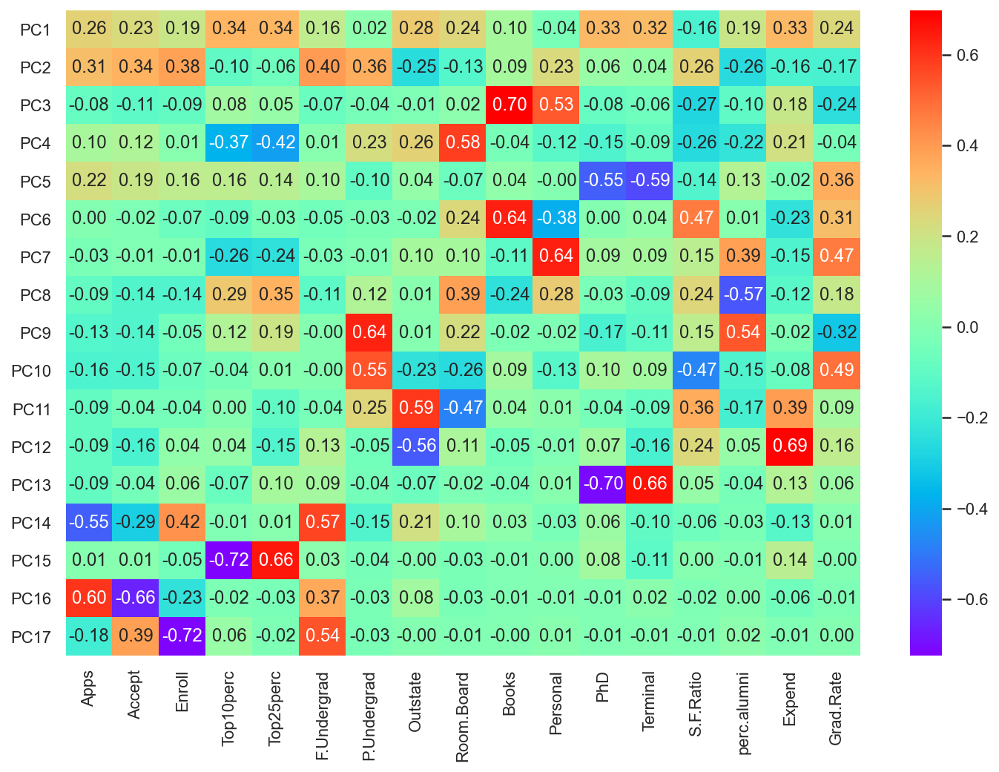

In [98]:
plt.figure(figsize=(12,8));
sns.heatmap(df_pc_comp,cmap='rainbow', annot=True, fmt='.2f');
plt.savefig('pc_comp.jpg', bbox_inches='tight');